In [2]:
%matplotlib inline
import numpy as np
import pandas as pd
# pd.set_option("display.max_columns", 50)
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as GridSpec
from tensorflow import keras
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots


import pywt
import scaleogram as scg 
from mat4py import loadmat
from scipy.fftpack import fft, ifft
import wfdb
import re
from math import *
#from tqdm import tqdm
from tqdm.notebook import tqdm
import warnings
warnings.filterwarnings('ignore')
import time
import sys

In [2]:
start_time = time.time()
end_time = time.time()
print("Run time = {}".format(end_time - start_time))

Run time = 5.1975250244140625e-05


# Read source for create a dataset of annotations
Source : https://physionet.org/content/butqdb/1.0.0/

In [5]:
# Create concatenated dataset with annotation & added informations for all patients
# source wfdb
header_list = ["start1", "end1", "class1","start2", "end2", "class2","start3", "end3", "class3","start", "end", "class"]
record_list = wfdb.get_record_list('butqdb') # Save the list of ECG file names
dataannall = pd.DataFrame(columns=header_list) 
for rcd in record_list:
    # Look for each patient the annotation file
    #print(rcd)
    if re.search(r'ECG$', rcd):
        record_name = f"../aura-data/{rcd}"
        print(record_name, end="\r")
        record_csv = f"../aura-data/{rcd.replace('ECG','ANN')}.csv"
        dataann = pd.read_csv(record_csv, names=header_list)
        dataannall = pd.concat([dataannall,dataann.assign(record=rcd.split('/')[0])], ignore_index=True)
#Add columns to dataset : record, signal length, number of samples of 5000 data, filter with not null value in label columns
dataannall['signal_length']=dataannall['end'] - dataannall['start'] 
dataannall["sample"]=round(dataannall["signal_length"]/sample_size)
dataset = dataannall[dataannall["class"].notnull() & dataannall["start"].notnull() & dataannall["end"].notnull() ]


In [6]:
dataset.shape

(7154, 15)

In [7]:
dataset.head()

,start1,end1,class1,start2,end2,class2,start3,end3,class3,start,end,class,record,signal_length,sample
0,1.0,198867.0,2.0,1.0,19525.0,1.0,1,7047,2,1.0,7047.0,2.0,100001,7046.0,1.0
1,198868.0,320282.0,1.0,19526.0,28694.0,2.0,7048,17209,1,7048.0,17209.0,1.0,100001,10161.0,2.0
2,320283.0,373109.0,2.0,28695.0,32739.0,1.0,17210,28390,2,17210.0,28694.0,2.0,100001,11484.0,2.0
3,373110.0,2197974.0,1.0,32740.0,96699.0,2.0,28391,32653,1,28695.0,32653.0,1.0,100001,3958.0,1.0
4,2197975.0,2582746.0,2.0,96700.0,110564.0,1.0,32654,71061,2,32654.0,112474.0,2.0,100001,79820.0,16.0


In [8]:
dataset.describe()

,start1,end1,class1,start2,end2,class2,start,end,class,signal_length,sample
count,2.076000e+03,2.076000e+03,2076.000000,4.305000e+03,4.305000e+03,4305.000000,7.154000e+03,7.154000e+03,7154.000000,7.154000e+03,7154.000000
mean,5.735894e+07,5.817328e+07,1.748073,5.950179e+07,5.987307e+07,1.572590,5.601431e+07,5.625521e+07,1.604417,2.409030e+05,48.144255
std,3.225315e+07,3.202552e+07,0.731805,3.072217e+07,3.057915e+07,0.603114,2.802337e+07,2.796447e+07,0.609641,2.530322e+06,506.072488
min,1.000000e+00,1.988670e+05,0.000000,1.000000e+00,1.952500e+04,0.000000,1.000000e+00,7.047000e+03,0.000000,3.020000e+02,0.000000
25%,2.961164e+07,2.970962e+07,1.000000,3.180192e+07,3.216237e+07,1.000000,3.405290e+07,3.411941e+07,1.000000,2.264250e+03,0.000000
50%,5.676074e+07,5.760000e+07,2.000000,5.791413e+07,5.792801e+07,2.000000,5.507225e+07,5.570303e+07,2.000000,5.853000e+03,1.000000
75%,7.522529e+07,7.664065e+07,2.000000,7.722608e+07,7.766738e+07,2.000000,6.858724e+07,6.945778e+07,2.000000,1.982150e+04,4.000000
max,1.391201e+08,1.391470e+08,3.000000,1.391468e+08,1.391470e+08,3.000000,1.391201e+08,1.391470e+08,3.000000,7.464800e+07,14930.000000


In [9]:
dataset.sort_values(by=['signal_length']).head(10)

,start1,end1,class1,start2,end2,class2,start3,end3,class3,start,end,class,record,signal_length,sample
2164,29830121.0,29843829.0,2.0,29833497.0,29842799.0,2.0,29041071,29041373,2,29041071.0,29041373.0,2.0,104001,302.0,0.0
6902,NaN,NaN,NaN,NaN,NaN,NaN,22772239,22806837,1,42187296.0,42187599.0,2.0,111001,303.0,0.0
14215,57653762.0,57664665.0,1.0,29052794.0,29058124.0,1.0,28815944,28816279,1,28871845.0,28872149.0,1.0,121001,304.0,0.0
1961,29896114.0,29909814.0,1.0,29430978.0,29432026.0,2.0,29201971,29203041,2,29367658.0,29367979.0,2.0,103003,321.0,0.0
14982,NaN,NaN,NaN,65811759.0,65824014.0,3.0,58413007,58414129,1,65500416.0,65500737.0,2.0,124001,321.0,0.0
15543,57711177.0,57779132.0,1.0,29622202.0,29624040.0,1.0,28902711,29014385,1,29637312.0,29637634.0,1.0,126001,322.0,0.0
2087,NaN,NaN,NaN,NaN,NaN,NaN,29712177,29713943,2,29974330.0,29974654.0,2.0,103003,324.0,0.0
1347,NaN,NaN,NaN,29422321.0,29423807.0,2.0,2.95904e+07,2.95909e+07,2,29583767.0,29584095.0,2.0,100002,328.0,0.0
15582,NaN,NaN,NaN,57917191.0,57917810.0,2.0,57655491,57655835,2,58410626.0,58410956.0,2.0,126001,330.0,0.0
14943,NaN,NaN,NaN,65570247.0,65579982.0,1.0,58189527,58190516,2,65289466.0,65289798.0,2.0,124001,332.0,0.0


In [10]:
dataannall.sort_values(by=['sample'],ascending=False).head(10)

,start1,end1,class1,start2,end2,class2,start3,end3,class3,start,end,class,record,signal_length,sample
14558,NaN,NaN,NaN,NaN,NaN,NaN,29981332,29991362,2,58800001.0,133448000.0,0.0,123001,74647999.0,14930.0
14419,NaN,NaN,NaN,NaN,NaN,NaN,58497423,58499060,1,58800001.0,122798000.0,0.0,122001,63997999.0,12800.0
2299,1.0,47323379.0,3.0,1.0,47323871.0,3.0,1,47323500,3,1.0,47323500.0,3.0,105001,47323499.0,9465.0
15596,NaN,NaN,NaN,58407654.0,58408005.0,2.0,57821475,57824016,2,58800001.0,92361000.0,0.0,126001,33560999.0,6712.0
13716,57600001.0,58800000.0,1.0,29389929.0,29392545.0,2.0,28903735,28905450,2,58800001.0,91651000.0,0.0,114001,32850999.0,6570.0
14375,NaN,NaN,NaN,NaN,NaN,NaN,58662590,58670947,1,58800001.0,91233000.0,0.0,121001,32432999.0,6487.0
13539,NaN,NaN,NaN,NaN,NaN,NaN,36544236,36546336,1,58800001.0,91148000.0,0.0,113001,32347999.0,6470.0
14073,NaN,NaN,NaN,58800001.0,89091000.0,0.0,58102368,58112099,2,58800001.0,89091000.0,0.0,118001,30290999.0,6058.0
13892,NaN,NaN,NaN,NaN,NaN,NaN,58398360,58401557,1,58800001.0,87934000.0,0.0,115001,29133999.0,5827.0
1512,1.0,28800000.0,0.0,1.0,28800000.0,0.0,1,28800000,0,1.0,28800000.0,0.0,103001,28799999.0,5760.0


In [11]:
dataset.record.unique()

array(['100001', '100002', '103001', '103002', '103003', '104001',
       '105001', '111001', '113001', '114001', '115001', '118001',
       '121001', '122001', '123001', '124001', '125001', '126001'],
      dtype=object)

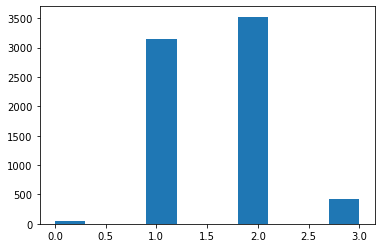

In [12]:
plt.hist(dataset['class'], bins=10);
plt.show()

In [13]:
fig = px.histogram(dataset, x="class", nbins=10)
fig.show()

In [14]:
fig = px.histogram(dataset, x="sample", nbins=10)
fig.show()

In [15]:
dataannall.dtypes

start1           float64
end1             float64
class1           float64
start2           float64
end2             float64
class2           float64
start3            object
end3              object
class3            object
start            float64
end              float64
class            float64
record            object
signal_length    float64
sample           float64
dtype: object

In [16]:
fig = px.histogram(dataannall[dataannall['sample'] < 10]['sample'], nbins=10)
fig.show()

In [17]:
pie_chart_data = dataset[dataset['record'] == '100001'].groupby('class')['sample'].sum()
pie_chart_data.shape

(3,)

In [18]:
dataannall.record.unique()

array(['100001', '100002', '103001', '103002', '103003', '104001',
       '105001', '111001', '113001', '114001', '115001', '118001',
       '121001', '122001', '123001', '124001', '125001', '126001'],
      dtype=object)

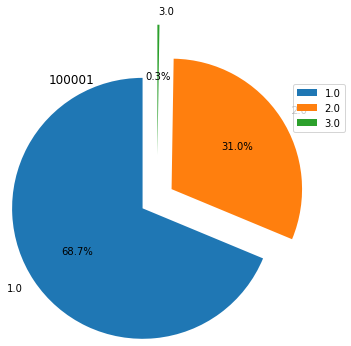

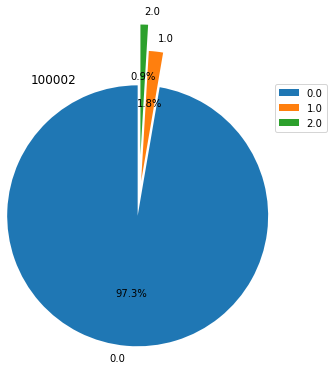

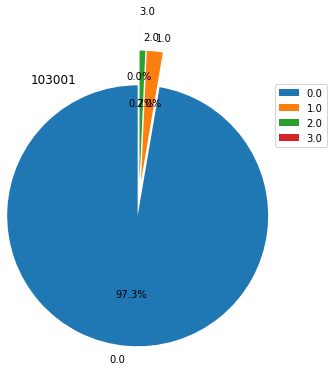

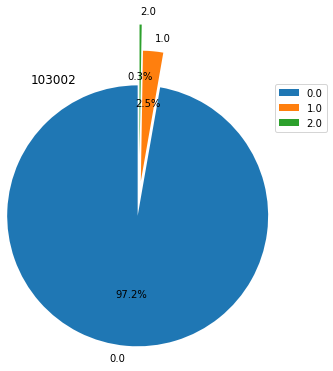

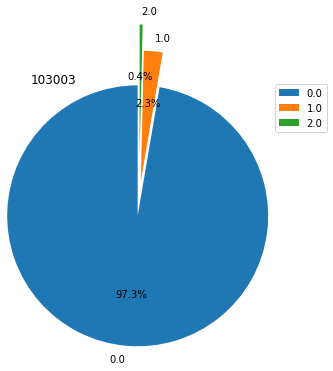

...

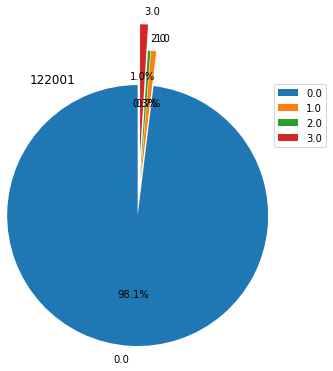

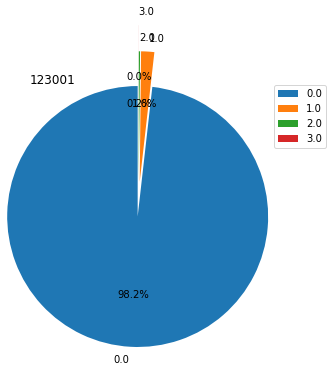

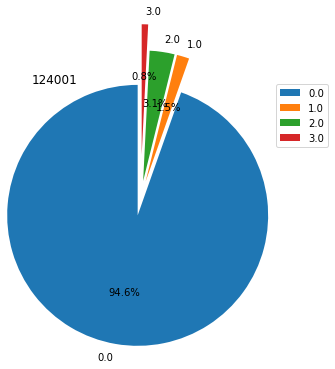

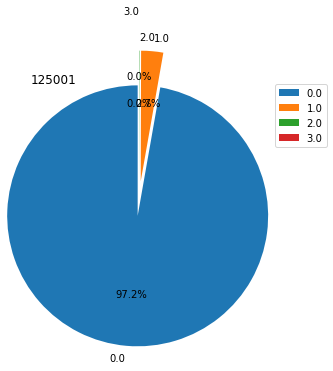

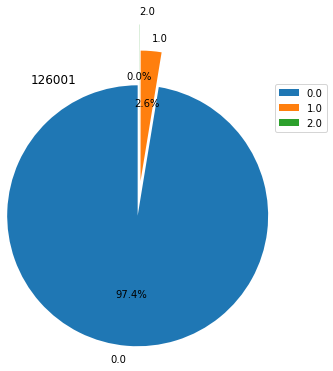

In [21]:
"""dataset['class_name'] = dataset['class'].apply(lambda x:
                                                     "Class 1: All significant waveforms" if int(x)==1 
                                                     else "Class 2: The noise level is increased" if int(x)==2
                                                     else "Class 3: The signal is unsuitable for any analysis. " if int(x)==3 
                                                     else "Class 0: The quality was not annotated ")
"""
for patient in dataannall.record.unique():
    pie_chart_data = dataset[dataset['record'] == patient].groupby('class')['sample'].sum()
    if pie_chart_data.shape[0] == 3:
        explode = (0.2,0.2,0.5)
    else:
        explode = (0.2,0.2,0.2,0.5)
    
    plt.figure()
    plt.pie(pie_chart_data.values, labels=pie_chart_data.index,  
           autopct='%1.1f%%',
           shadow=False, 
           startangle=90,
           explode=explode,
           radius=1.5
           )
    plt.title(patient, fontdict=None,loc='left')
    plt.legend(bbox_to_anchor=(1.1, 1.05))
    plt.show()

In [ ]:
# Do Pie Chart with plotly
#df = px.data.gapminder().query("year == 2007").query("continent == 'Europe'")
#df.loc[df['pop'] < 2.e6, 'country'] = 'Other countries' # Represent only large countries
#fig = px.pie(df, values='pop', names='country', title='Population of European continent')
#fig.show()

## Exploration : Register in the list all file paths

In [57]:
# Read the file path we have in the current folder 

# Save image path of training data
import pathlib 
file_paths = pathlib.Path('../aura-data')

# Convert all paths into a string with comprehension list
file_paths = [str(file_path) for file_path in list(file_paths.glob("*/*"))] # list python files in the directory tree
file_paths[:5]


['../aura-data/118001/118001_ECG.hea',
 '../aura-data/118001/118001_ACC.hea',
 '../aura-data/118001/118001_ANN.csv',
 '../aura-data/118001/118001_ACC.dat',
 '../aura-data/118001/118001_ECG.dat']

In [58]:
import re
# Filter ECG .dat file paths
r = re.compile(".*ECG\.dat$") # create regex to match ECG.dat files
ecg_file_dat_paths = list(filter(r.match, file_paths)) # Filter only paths for .dat files
print(ecg_file_dat_paths[:5])

['../aura-data/118001/118001_ECG.dat', '../aura-data/100002/100002_ECG.dat', '../aura-data/126001/126001_ECG.dat', '../aura-data/122001/122001_ECG.dat', '../aura-data/123001/123001_ECG.dat']


In [59]:
# Filter csv ANNOTATION file paths
r = re.compile(".*ANN\.csv$") # create regex to match ANN.csv files
ann_file_csv_paths = list(filter(r.match, file_paths)) # Filter only paths for .dat files
print(ann_file_csv_paths[:5])

['../aura-data/118001/118001_ANN.csv', '../aura-data/100002/100002_ANN.csv', '../aura-data/126001/126001_ANN.csv', '../aura-data/122001/122001_ANN.csv', '../aura-data/123001/123001_ANN.csv']


In [60]:
# Create list of patient ids
r = re.compile(".*[0-9]+")
folder_paths = pathlib.Path('../aura-data')
patient_ids = [str(folder_name) for folder_name in list(folder_paths.iterdir()) if folder_name.is_dir()] # extract folder paths in the current directory
patient_ids = list(filter(r.findall, patient_ids))
patient_ids = [re.findall('\d+', x )[0] for x in patient_ids]
patient_ids

['118001',
 '100002',
 '126001',
 '122001',
 '123001',
 '103001',
 '113001',
 '104001',
 '114001',
 '100001',
 '124001',
 '111001',
 '125001',
 '105001',
 '121001',
 '115001',
 '103003',
 '103002']

## Exploration : class volumes for each patient file

In [232]:
sample_size = 2000
# Create list with class label for each range of 1000 values
alist=[]
for i in range(0,len(df_csv)):
    if int(df_csv.end[i]) > len(alist)*sample_size:
        #print(i)
        for ii in range(0, (int(df_csv.end[i])-len(alist)*sample_size)//sample_size):
            alist.append(df_csv["class"][i])

In [233]:
pie_chart_data = pd.DataFrame(alist,columns=["class"]).groupby('class')["class"].count()
pie_chart_data

class
1    19011
2    24308
3     2003
Name: class, dtype: int64

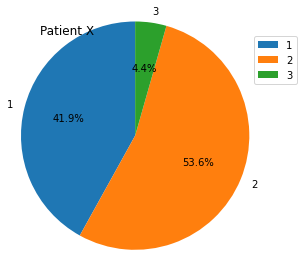

In [234]:
plt.figure(figsize=(5,3.5))
plt.pie(pie_chart_data.values, labels=pie_chart_data.index,  
       autopct='%1.1f%%',
       shadow=False, 
       startangle=90,
       radius=1.5
       )
plt.title("Patient X", fontdict=None,loc='left')
plt.legend(bbox_to_anchor=(1.1, 1.05))
plt.show()

In [235]:
fig = px.pie(values=pie_chart_data.values, names=pie_chart_data.index,title='Class ')
fig.update_layout(height=400, width=600, title_text="Subplots with Annotations")
fig.show()

In [236]:
df_patients=[]
for patient_id, ann_file_csv_patient_path in zip(patient_ids, ann_file_csv_paths):
    df_patients.append((patient_id, ann_file_csv_patient_path))
df_patients 

[('118001', '../aura-data/118001/118001_ANN.csv'),
 ('100002', '../aura-data/100002/100002_ANN.csv'),
 ('126001', '../aura-data/126001/126001_ANN.csv'),
 ('122001', '../aura-data/122001/122001_ANN.csv'),
 ('123001', '../aura-data/123001/123001_ANN.csv'),
 ('103001', '../aura-data/103001/103001_ANN.csv'),
 ('113001', '../aura-data/113001/113001_ANN.csv'),
 ('104001', '../aura-data/104001/104001_ANN.csv'),
 ('114001', '../aura-data/114001/114001_ANN.csv'),
 ('100001', '../aura-data/100001/100001_ANN.csv'),
 ('124001', '../aura-data/124001/124001_ANN.csv'),
 ('111001', '../aura-data/111001/111001_ANN.csv'),
 ('125001', '../aura-data/125001/125001_ANN.csv'),
 ('105001', '../aura-data/105001/105001_ANN.csv'),
 ('121001', '../aura-data/121001/121001_ANN.csv'),
 ('115001', '../aura-data/115001/115001_ANN.csv'),
 ('103003', '../aura-data/103003/103003_ANN.csv'),
 ('103002', '../aura-data/103002/103002_ANN.csv')]

In [237]:
df_patients[0][1]

'../aura-data/118001/118001_ANN.csv'

In [238]:
# Prepare list of patient data
list_patients=[]
for patient_id, ann_file_csv_patient_path in zip(patient_ids, ann_file_csv_paths):
    # See annotation file for patient
    header_list = ["start1", "end1", "class1","start2", "end2", "class2","start3", "end3", "class3","start", "end", "class"]
    sample_size = 2000
    df_csv = pd.read_csv(ann_file_csv_patient_path, names=header_list)
    df_csv = df_csv[df_csv["class"].notnull() & df_csv["start"].notnull() & df_csv["end"].notnull()]
    # Create list with class label for each range of 1000 values
    alist=[]
    for i in range(0,len(df_csv)):
        if int(df_csv.end[i]) > len(alist)*sample_size:
            #print(i)
            for ii in range(0, (int(df_csv.end[i])-len(alist)*sample_size)//sample_size):
                alist.append(df_csv["class"][i])
    pie_chart_data = pd.DataFrame(alist,columns=["class"]).groupby('class')["class"].count()
    list_patients.append((patient_id, pie_chart_data))
list_patients[:4]

[('118001',
  class
  0.0    43345
  1.0      758
  2.0      442
  Name: class, dtype: int64),
 ('100002',
  class
  0.0    42181
  1.0      780
  2.0      420
  Name: class, dtype: int64),
 ('126001',
  class
  0.0    44980
  1.0     1185
  2.0       15
  Name: class, dtype: int64),
 ('122001',
  class
  0.0    60199
  1.0      408
  2.0      192
  3.0      600
  Name: class, dtype: int64)]

In [239]:
list_patients[0][1]

class
0.0    43345
1.0      758
2.0      442
Name: class, dtype: int64

In [240]:
# Create subplots: use 'domain' type for Pie subplot
rows = 6; cols = 3
specs = [[{'type':'domain'} for i in range (cols)] for i in range(rows)]
fig = make_subplots(rows=rows, cols=cols, specs=specs, subplot_titles=patient_ids)
#for _, pie_chart_data in list_patients:
for i in range(rows):
    for j in range(cols):
        fig.add_trace(go.Pie(labels=list(list_patients[3*i+j][1].index), values=list(list_patients[3*i+j][1].values), name="Class percentage"), i+1, j+1)
fig.update_layout(height=700, width=900, title_text="Patient class repartition")
fig.show()
        

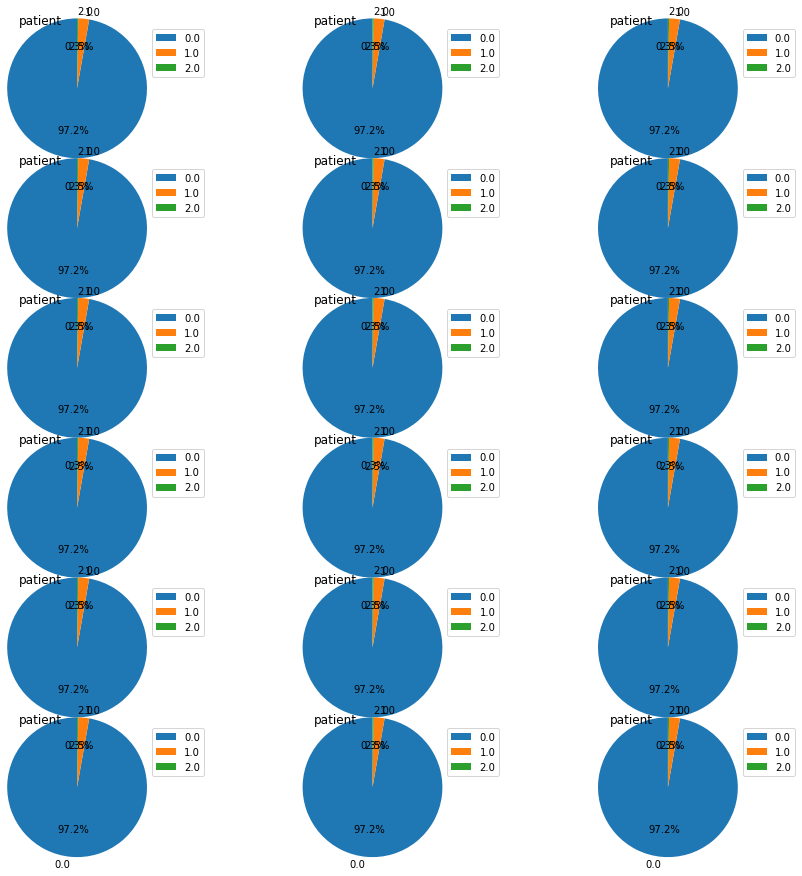

In [241]:
rows = 6
cols = 3
f, axs = plt.subplots(rows,cols,figsize=(15,15))

for i in range(rows):
    for j in range(cols):
        plt.subplot(rows, cols, 3*i+j+1)
        plt.pie(pie_chart_data.values, labels=pie_chart_data.index,  
           autopct='%1.1f%%',
           shadow=False, 
           startangle=90,
           radius=1.5
               )
        plt.title("patient", fontdict=None,loc='left')
        plt.legend(bbox_to_anchor=(1.1, 1.05))

plt.show()

# Read source and create 2 lists
ecg_data : data
ecg_labels : labels quality class (1, 2 or 3; 0 means the quality was not annotated in this segment) 
Source : https://physionet.org/content/butqdb/1.0.0/

In [53]:
#For cut sample into n sample with cut_size
def ecgreshape(ecg_array,cut_size):
    ecg_size_multi = ceil(ecg_array.shape[0]/cut_size) # define number of subsamples
    ecg_result = np.zeros(ecg_size_multi*cut_size) # create an zero array of 5000 * subsamples
    ecg_result[:ecg_array.shape[0]] = ecg_array
    print(f"Array size {ecg_array.shape[0]} cut by {cut_size} done {ecg_size_multi}", end="\r")
    ecg_result = np.reshape(ecg_result, (ecg_size_multi,cut_size))
    return ecg_result

## Test with patient : 105001 [version 0]

In [54]:
# See annotation file for patient 105001
dataann = pd.read_csv("../aura-data/105001/105001_ANN.csv", names=header_list)
dataannclear = dataann[dataann["class"].notnull() & dataann["start"].notnull() & dataann["end"].notnull() ]
dataannclear['signal_length']=dataannclear['end'] - dataannclear['start'] 
dataannclear["sample"]=round(dataannclear["signal_length"]/sample_size)+1
dataannclear["indice"]=""
for i in range(len(dataannclear["sample"])):
    dataannclear.loc[i,"indice"]=dataannclear.loc[0:i,"sample"].values.sum()
display(dataannclear[0:10].head())


,start1,end1,class1,start2,end2,class2,start3,end3,class3,start,end,class,signal_length,sample,indice
0,1.0,47323379.0,3.0,1.0,47323871.0,3.0,1,47323500,3,1.0,47323500.0,3.0,47323499.0,9466.0,9466
1,47323380.0,47388207.0,2.0,47323872.0,47329547.0,1.0,47323501,47323539,1,47323501.0,47326788.0,2.0,3287.0,2.0,9468
2,47388208.0,47404719.0,1.0,47329548.0,47333899.0,2.0,47323540,47326788,2,47326789.0,47329547.0,1.0,2758.0,2.0,9470
3,47404720.0,47449035.0,2.0,47333900.0,47370615.0,1.0,47326789,47329715,1,47329548.0,47333904.0,2.0,4356.0,2.0,9472
4,47449036.0,47492819.0,1.0,47370616.0,47377747.0,2.0,47329716,47333904,2,47333905.0,47370615.0,1.0,36710.0,8.0,9480


We notice that the first line has a range of 47 millions that is quite huge
It seems to be an outliers, so we won't take it in account at first step

In [28]:
# Extract 5 first registers from 105001_ECG.dat, store data in ecg_data_105001 & label in ecg_labels_105001
header_list = ["start1", "end1", "class1","start2", "end2", "class2","start3", "end3", "class3","start", "end", "class"]
record_list = wfdb.get_record_list('butqdb')
record_list =['105001/105001_ECG']
ecg_data_105001=[np.zeros(sample_size)]
ecg_labels_105001=[0]
for rcd in record_list:
    if re.search(r'ECG$', rcd):
        record_name = f"../aura-data/{rcd}"
        print(record_name)
        record_csv = f"../aura-data/{rcd.replace('ECG','ANN')}.csv"
        dataann = pd.read_csv(record_csv, names=header_list)
        dataannclear = dataann[dataann["class"].notnull() & dataann["start"].notnull() & dataann["end"].notnull() ] 
        # We just take the rows of index from 1 to 5 in our dataset
        for i in tqdm(dataannclear[1:6].index):
            record = wfdb.rdrecord(record_name, sampfrom=int(dataannclear.start[i]), sampto=int(dataannclear.end[i]))
            ecg_data_105001 = np.concatenate((ecg_data_105001,ecgreshape(record.adc()[:,0],sample_size)), axis=0)
            ecg_size_multi = ceil(record.adc()[:,0].shape[0]/sample_size)
            ecg_labels_105001 = ecg_labels_105001 + [ int(dataannclear["class"][i]) for ii in range(ecg_size_multi)]
            #ecg_labels_test.append([int(dataannclear_nan_class["class"][i])])
ecg_data_105001 = np.delete(ecg_data_105001, (0), axis=0)
del ecg_labels_105001[0]
            

../aura-data/105001/105001_ECG


Array size 7131 cut by 5000 done 2


In [36]:
# Verify data & label array are ok
display(ecg_data_105001,ecg_labels_105001)

array([[-2.3653e+04, -2.3652e+04, -2.3650e+04, ...,  0.0000e+00,
         0.0000e+00,  0.0000e+00],
       [-8.6330e+03, -8.6210e+03, -8.6080e+03, ...,  0.0000e+00,
         0.0000e+00,  0.0000e+00],
       [-3.1110e+03, -3.1180e+03, -3.1130e+03, ...,  0.0000e+00,
         0.0000e+00,  0.0000e+00],
       ...,
       [-1.4000e+01, -9.0000e+00, -1.1000e+01, ...,  0.0000e+00,
         0.0000e+00,  0.0000e+00],
       [-5.8000e+01, -4.6000e+01, -3.4000e+01, ...,  5.0300e+02,
         4.9800e+02,  4.9400e+02],
       [ 5.0000e+02,  5.1300e+02,  5.2500e+02, ...,  0.0000e+00,
         0.0000e+00,  0.0000e+00]])

[2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2]

## Test with patient : 111001 [version 0]

In [169]:
# See annotation file for patient 111001
#dataann = pd.read_csv("../aura-data/111001/111001_ANN.csv", names=header_list)
dataannclear = dataann[dataann["class"].notnull() & dataann["start"].notnull() & dataann["end"].notnull()]
dataannclear['signal_length']=dataannclear['end'] - dataannclear['start'] 
dataannclear["sample"]=round(dataannclear["signal_length"]/sample_size)+1
# Create new column to have index rank
dataannclear["indice"]=""
for i in range(len(dataannclear["sample"])):
    dataannclear.loc[i,"indice"]=dataannclear.loc[0:i,"sample"].values.sum()
display(dataannclear.tail())


,start1,end1,class1,start2,end2,class2,start3,end3,class3,start,end,class,signal_length,sample,indice
2734,NaN,NaN,NaN,NaN,NaN,NaN,35206925,35212255,1,88835329.0,88857959.0,1.0,22630.0,6.0,20363
2735,NaN,NaN,NaN,NaN,NaN,NaN,35212256,35217108,2,88857960.0,89860280.0,2.0,1002320.0,201.0,20564
2736,NaN,NaN,NaN,NaN,NaN,NaN,35217109,35222483,1,89860281.0,89872911.0,1.0,12630.0,4.0,20568
2737,NaN,NaN,NaN,NaN,NaN,NaN,35222484,35270820,2,89872912.0,90622551.0,2.0,749639.0,151.0,20719
2738,NaN,NaN,NaN,NaN,NaN,NaN,35270821,35273851,1,90622552.0,90645000.0,3.0,22448.0,5.0,20724


It seems to have a quite huge unbalance between classes, with a lot of values classed in class 2

In [170]:
# Extract 5 first registers from 105001_ECG.dat, store data in ecg_data_105001 & label in ecg_labels_105001
header_list = ["start1", "end1", "class1","start2", "end2", "class2","start3", "end3", "class3","start", "end", "class"]
record_list = wfdb.get_record_list('butqdb')
record_list =['111001/111001_ECG']
ecg_data_111001=[np.zeros(sample_size)]
ecg_labels_111001=[0]
for rcd in record_list:
    if re.search(r'ECG$', rcd):
        record_name = f"../aura-data/{rcd}"
        print(record_name)
        record_csv = f"../aura-data/{rcd.replace('ECG','ANN')}.csv"
        dataann = pd.read_csv(record_csv, names=header_list)
        dataannclear = dataann[dataann["class"].notnull() & dataann["start"].notnull() & dataann["end"].notnull() ] 
        # We just take the rows of index from 1 to 5 in our dataset
        for i in tqdm(dataannclear.index):
            record = wfdb.rdrecord(record_name, sampfrom=int(dataannclear.start[i]), sampto=int(dataannclear.end[i]))
            ecg_data_111001 = np.concatenate((ecg_data_111001,ecgreshape(record.adc()[:,0],sample_size)), axis=0)
            ecg_size_multi = ceil(record.adc()[:,0].shape[0]/sample_size)
            ecg_labels_111001 = ecg_labels_111001 + [ int(dataannclear["class"][i]) for ii in range(ecg_size_multi)]
            #ecg_labels_test.append([int(dataannclear_nan_class["class"][i])])
ecg_data_111001 = np.delete(ecg_data_111001, (0), axis=0)
del ecg_labels_111001[0]
            

../aura-data/111001/111001_ECG


Array size 22448 cut by 5000 done 51501


In [259]:
# Verify data & label array are ok
display(ecg_data_111001,ecg_labels_111001)

[2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 2,
 2,
 2,
 1,
 1,
 1,
 2,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 2,
 2,
 2,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,


[2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 2,
 2,
 2,
 1,
 1,
 1,
 2,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 2,
 2,
 2,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,


In [192]:
# Split data in different array for each class
arr_class_1 = [np.zeros(sample_size)]
arr_class_2 = [np.zeros(sample_size)]
# Filter the 200 first values
for i, j in tqdm(enumerate(ecg_labels_111001)):
    if j == 1:
        arr_class_1 = np.append(arr_class_1,[ecg_data_111001[i]],axis=0)
    if j == 2:
        arr_class_2 = np.append(arr_class_2,[ecg_data_111001[i]],axis=0)
arr_class_1 = np.delete(arr_class_1, (0), axis=0)
arr_class_2 = np.delete(arr_class_2, (0), axis=0)

## Test with patient : 111001 [version 0]

In [ ]:
#For cut sample into n sample with cut_size
def ecgreshape(ecg_array,cut_size):
    ecg_size_multi = ceil(ecg_array.shape[0]/cut_size) # define number of subsamples
    ecg_result = np.zeros(ecg_size_multi*cut_size) # create an zero array of 5000 * subsamples
    ecg_result[:ecg_array.shape[0]] = ecg_array
    print(f"Array size {ecg_array.shape[0]} cut by {cut_size} done {ecg_size_multi}", end="\r")
    ecg_result = np.reshape(ecg_result, (ecg_size_multi,cut_size))
    return ecg_result

In [ ]:
# Extract 5 first registers from 105001_ECG.dat, store data in ecg_data_105001 & label in ecg_labels_105001
header_list = ["start1", "end1", "class1","start2", "end2", "class2","start3", "end3", "class3","start", "end", "class"]
record_list = wfdb.get_record_list('butqdb')
record_list =['111001/111001_ECG']
ecg_data_111001=[np.zeros(sample_size)]
ecg_labels_111001=[0]
sample_size_1000 = 1000
for rcd in record_list:
    if re.search(r'ECG$', rcd):
        record_name = f"../aura-data/{rcd}"
        print(record_name)
        record_csv = f"../aura-data/{rcd.replace('ECG','ANN')}.csv"
        dataann = pd.read_csv(record_csv, names=header_list)
        dataannclear = dataann[dataann["class"].notnull() & dataann["start"].notnull() & dataann["end"].notnull() ] 
        # We just take the rows of index from 1 to 5 in our dataset
        for i in tqdm(dataannclear.index):
            record = wfdb.rdrecord(record_name, sampfrom=int(dataannclear.start[i]), sampto=int(dataannclear.end[i]))
            ecg_data_111001 = np.concatenate((ecg_data_111001,ecgreshape(record.adc()[:,0],sample_size_1000)), axis=0)
            #ecg_size_multi = ceil(record.adc()[:,0].shape[0]/sample_size)
            #ecg_labels_111001 = ecg_labels_111001 + [ int(dataannclear["class"][i]) for ii in range(ecg_size_multi)]
            #ecg_labels_test.append([int(dataannclear_nan_class["class"][i])])
#ecg_data_111001 = np.delete(ecg_data_111001, (0), axis=0)
#del ecg_labels_111001[0]

## Test with patient 111001 with signal 1000 values length [version 1]

In [29]:
# See annotation file for patient 111001
header_list = ["start1", "end1", "class1","start2", "end2", "class2","start3", "end3", "class3","start", "end", "class"]
df_csv = pd.read_csv("../aura-data/111001/111001_ANN.csv", names=header_list)
df_csv = df_csv[df_csv["class"].notnull() & df_csv["start"].notnull() & df_csv["end"].notnull()]
df_csv.head()


,start1,end1,class1,start2,end2,class2,start3,end3,class3,start,end,class
0,1.0,4315694.0,2.0,1.0,411254.0,2.0,1,7523,1,1.0,415143.0,2.0
1,4315695.0,4334794.0,1.0,411255.0,421291.0,1.0,7524,16977,2,415144.0,421291.0,1.0
2,4334795.0,7908996.0,2.0,421292.0,433271.0,2.0,16978,18848,1,421292.0,433515.0,2.0
3,7908997.0,7915643.0,1.0,433272.0,447315.0,1.0,18849,105566,2,433516.0,447315.0,1.0
4,7915644.0,13719093.0,2.0,447316.0,451027.0,2.0,105567,108563,1,447316.0,451027.0,2.0


In [31]:
# Create list with class label for each range of 1000 values
alist=[]
for i in range(0,len(df_csv)):
    if int(df_csv.end[i]) > len(alist)*1000:
        #print(i)
        for ii in range(0, (int(df_csv.end[i])-len(alist)*1000)//1000):
            alist.append(df_csv["class"][i])
len(alist)
# Create dataframe with list to have the percentage of classes
display(pd.DataFrame(alist).value_counts())
# Import data and reshape it to array matrix with 1000 features 
# Import all data in array
arr_data = wfdb.rdrecord("../aura-data/111001/111001_ECG")
arr_data = arr_data.adc()
arr_data.shape
# Reshape vector data into a Matrix
arr_data = arr_data.reshape(arr_data.shape[0]//1000,1000)
display(arr_data.shape)
# Concatenate data array matrix with label column vector array
arr_data = np.concatenate((arr_data,np.array(alist).reshape(len(alist),1)), axis=1)
display(arr_data.shape)
arr_class_1 = arr_data[arr_data[:,1000]==1][:,:1000]
arr_class_2 = arr_data[arr_data[:,1000]==2][:,:1000]
arr_class_3 = arr_data[arr_data[:,1000]==3][:,:1000]
display(arr_data.shape,arr_data.shape,arr_data.shape)
# Take one row values example for each class
# df_data_1000.groupby(1000,group_keys=False).apply(lambda df_data_1000 : df_data_1000.sample(1))
# Store dataframe in CSV file
# df_data_labels.to_csv("data_111001.csv")

2.0    48598
1.0    38029
3.0     4018
dtype: int64

(90645, 1000)

(90645, 1001)

(90645, 1001)

(90645, 1001)

(90645, 1001)

## Reduce signal length to 250

In [151]:
arr_class_1_1000_resampled = arr_class_1_1000[:,:1000:4]/1000
arr_class_2_1000_resampled = arr_class_2_1000[:,:1000:4]/1000
arr_class_3_1000_resampled = arr_class_3_1000[:,:1000:4]/1000
display(arr_class_1_1000_resampled.shape,arr_class_2_1000_resampled.shape,arr_class_3_1000_resampled.shape)

(38029, 250)

(48598, 250)

(4018, 250)

## Test with patient 111001 with signal 2000 values length and Frequence 250 [version 1]

In [3]:
# See annotation file for patient 111001
header_list = ["start1", "end1", "class1","start2", "end2", "class2","start3", "end3", "class3","start", "end", "class"]
df_csv = pd.read_csv("../aura-data/111001/111001_ANN.csv", names=header_list)
df_csv = df_csv[df_csv["class"].notnull() & df_csv["start"].notnull() & df_csv["end"].notnull()]
df_csv.head()


,start1,end1,class1,start2,end2,class2,start3,end3,class3,start,end,class
0,1.0,4315694.0,2.0,1.0,411254.0,2.0,1,7523,1,1.0,415143.0,2.0
1,4315695.0,4334794.0,1.0,411255.0,421291.0,1.0,7524,16977,2,415144.0,421291.0,1.0
2,4334795.0,7908996.0,2.0,421292.0,433271.0,2.0,16978,18848,1,421292.0,433515.0,2.0
3,7908997.0,7915643.0,1.0,433272.0,447315.0,1.0,18849,105566,2,433516.0,447315.0,1.0
4,7915644.0,13719093.0,2.0,447316.0,451027.0,2.0,105567,108563,1,447316.0,451027.0,2.0


In [4]:
sample_size = 2000
resample = 1
# Create list with class label for each range of 1000 values
alist=[]
for i in range(0,len(df_csv)):
    if int(df_csv.end[i]) > len(alist)*sample_size:
        #print(i)
        for ii in range(0, (int(df_csv.end[i])-len(alist)*sample_size)//sample_size):
            alist.append(df_csv["class"][i])

In [5]:
# Create dataframe with list to have the percentage of classes
pd.DataFrame(alist).value_counts()

2.0    24308
1.0    19011
3.0     2003
dtype: int64

In [6]:
# Import data and reshape it to array matrix with 1000 features 
# Import all data in array
arr_data = wfdb.rdrecord("../aura-data/111001/111001_ECG")
arr_data = arr_data.adc()
arr_data.shape

(90645000, 1)

In [7]:
# need to have number of rows which is a multiple of sample_size
arr_data_size = (arr_data.shape[0]//sample_size)*sample_size
# Reshape vector data into a Matrix
arr_data = arr_data[:arr_data_size].reshape(arr_data[:arr_data_size].shape[0]//sample_size,sample_size)
arr_data

array([[21753, 21748, 21770, ..., 13571, 13584, 13604],
       [13610, 13594, 13592, ...,  7996,  7993,  7986],
       [ 7989,  7982,  7984, ...,  4873,  4866,  4866],
       ...,
       [  255,   255,   283, ...,  -130,  -131,  -143],
       [ -132,  -129,  -113, ...,   -88,  -104,  -117],
       [ -121,  -112,  -138, ...,    83,   103,    94]])

In [8]:
len(alist), arr_data.shape

(45322, (45322, 2000))

In [9]:
arr_data = arr_data[:,::resample]
arr_data.shape

(45322, 2000)

In [10]:
# Concatenate data array matrix with label column vector array
arr_data = np.concatenate((arr_data,np.array(alist).reshape(len(alist),1)), axis=1)
arr_data.shape

(45322, 2001)

In [425]:
# Create a dataframe pandas from data numpy array
df_data = pd.DataFrame(arr_data)
df_data = df_data.rename(columns={-1: "label"})
# pd.set_option("display.max_columns", 15)
df_data.head()

,0,1,2,3,4,5,6,...,1994,1995,1996,1997,1998,1999,2000
0,21753.0,21748.0,21770.0,21788.0,21789.0,21799.0,21793.0,...,13590.0,13574.0,13569.0,13571.0,13584.0,13604.0,2.0
1,13610.0,13594.0,13592.0,13594.0,13609.0,13628.0,13620.0,...,8000.0,8009.0,8001.0,7996.0,7993.0,7986.0,2.0
2,7989.0,7982.0,7984.0,8008.0,8030.0,8039.0,8049.0,...,4864.0,4868.0,4881.0,4873.0,4866.0,4866.0,2.0
3,4863.0,4860.0,4852.0,4844.0,4842.0,4846.0,4851.0,...,2752.0,2752.0,2744.0,2740.0,2732.0,2723.0,2.0
4,2715.0,2720.0,2721.0,2725.0,2736.0,2743.0,2741.0,...,1884.0,1882.0,1854.0,1822.0,1809.0,1792.0,2.0


In [356]:
# Take one row values example for each class
# df_data_2000_prez = df_data_2000.groupby("label",group_keys=False).apply(lambda df_data_2000 : df_data_2000.sample(2)).sample(frac=1).reset_index(drop=True)
# df_data_2000_prez.head()
# df_data_2000_prez[:15]

In [384]:
# Order dataframe by columns and transform it to np array
# arr_data_2000 = df_data_2000.sort_values(by=[2000]).values
# arr_data_2000[19008:19014]

array([[-166., -169., -168., ...,  369.,  368.,    1.],
       [  84.,   88.,   87., ...,  -84.,  -82.,    1.],
       [ 388.,  389.,  394., ...,  181.,  179.,    1.],
       [-445., -443., -435., ..., -416., -343.,    2.],
       [-353., -363., -376., ..., -377., -400.,    2.],
       [ -40.,  -54.,  -63., ...,   25.,   22.,    2.]])

### Convert to frequence 250Hz

In [11]:
arr_data.shape

(45322, 2001)

In [12]:
arr_class_1 = arr_data[arr_data[:,2000]==1][:,:2000:8] #[:,:2000:8] arr_data_2000[:19011]
arr_class_1 = arr_class_1/1000
arr_class_1

array([[ 0.141,  0.127,  0.131, ..., -0.145, -0.185, -0.195],
       [-0.191, -0.203, -0.184, ...,  0.137,  0.121,  0.121],
       [ 0.114,  0.103,  0.096, ..., -0.361, -0.366, -0.387],
       ...,
       [ 0.118,  0.125,  0.104, ...,  0.001, -0.031, -0.024],
       [-0.033, -0.034, -0.055, ..., -0.149, -0.163, -0.158],
       [-0.161, -0.159, -0.144, ..., -0.21 , -0.241, -0.22 ]])

In [13]:
arr_class_1.shape

(19011, 250)

In [14]:
arr_class_2 = arr_data[arr_data[:,2000]==2][:,:2000:8] # [:,:250] arr_data_2000[19011:19011+24308]
arr_class_2 = arr_class_2/1000
arr_class_2

array([[21.753, 21.789, 21.671, ..., 13.677, 13.654, 13.582],
       [13.61 , 13.597, 13.521, ...,  8.048,  8.018,  7.997],
       [ 7.989,  8.017,  8.025, ...,  4.88 ,  4.884,  4.866],
       ...,
       [-0.949, -1.03 , -1.164, ..., -2.29 , -2.65 , -3.868],
       [-3.325, -0.529, -0.295, ..., -3.024, -3.124, -2.85 ],
       [-1.805, -0.334, -0.356, ..., -0.328, -0.247, -0.229]])

In [15]:
arr_class_2.shape

(24308, 250)

In [16]:
arr_class_3 = arr_data[arr_data[:,2000]==3][:,:2000:8] # [:,:250] arr_data_2000[19011+24308:19011+24308+2003]
arr_class_3 = arr_class_3/1000
arr_class_3

array([[-0.053, -0.053, -0.144, ..., 10.115, 10.099, 10.314],
       [ 0.442,  0.436,  0.419, ...,  1.101,  0.965,  0.816],
       [ 1.145,  1.119,  1.077, ..., -0.825, -0.96 , -1.042],
       ...,
       [ 0.255,  0.255,  0.24 , ..., -0.129, -0.14 , -0.114],
       [-0.132, -0.132, -0.166, ..., -0.133, -0.105, -0.141],
       [-0.121, -0.096, -0.095, ...,  0.087,  0.077,  0.071]])

In [17]:
arr_class_3.shape

(2003, 250)

# Concatenate data from patients in the same dataset [version 2]

As we can see above, the patients with annotated values are patients with ids 111001, 100001, 105001.
So we will take these patients for the analysis

## Create dataset with labelized data from from all annotated patient data (111001, 100001, 105001)

In [ ]:
# Read the file path we have in the current folder 

# Save image path of training data
import pathlib 
file_paths = pathlib.Path('../aura-data')

# Convert all paths into a string with comprehension list
file_paths = [str(file_path) for file_path in list(file_paths.glob("*/*"))] # list python files in the directory tree
print(file_paths[:5])
# Select dat_path_file for patients 111001, 100001, 105001
r = re.compile(".*(111001|100001|105001)_ECG\.dat$") # create regex to match ECG.dat files
ecg_file_dat_paths = list(filter(r.match, file_paths)) # Filter only paths for .dat files
print(ecg_file_dat_paths[:5])
# Select csv_path_file for patients 111001, 100001, 105001
r = re.compile(".*(111001|100001|105001)_ANN\.csv$") # create regex to match ECG.dat files
ecg_file_csv_paths = list(filter(r.match, file_paths)) # Filter only paths for .dat files
print(ecg_file_csv_paths[:5])
# Create list of patient ids for patients 111001, 100001, 105001
r = re.compile(".*(111001|100001|105001)")
folder_paths = pathlib.Path('../aura-data')
patient_ids = [str(folder_name) for folder_name in list(folder_paths.iterdir()) if folder_name.is_dir()] # extract folder paths in the current directory
patient_ids = list(filter(r.findall, patient_ids))
patient_ids = [re.findall('\d+', x )[0] for x in patient_ids]
patient_ids

## Create dataset with labelized data from from all annotated patient data (111001)

In [119]:
from scipy import stats

def resampling_data(sample_size, dat_file_path, csv_file_path):
    # Import csv annotation file and remove lines with null start/ end/ class values
    header_list = ["start1", "end1", "class1","start2", "end2", "class2","start3", "end3", "class3","start", "end", "class"]
    df_csv = pd.read_csv(csv_file_path, names=header_list)
    df_csv = df_csv[df_csv["class"].notnull() & df_csv["start"].notnull() & df_csv["end"].notnull()]
    df_csv["start"] = df_csv["start"].astype(int)
    df_csv["end"] = df_csv["end"].astype(int)
    df_csv["class"] = df_csv["class"].astype(int)
    df_csv = df_csv[df_csv["class"]!=0].reset_index(drop=True)
    df_csv['signal_length']=df_csv['end'] - df_csv['start'] 
    #df_csv["sample"]=round(df_csv["signal_length"]/sample_size)+1
    display(df_csv.head())
    display(df_csv.tail())
    display(df_csv["class"].value_counts()/len(df_csv))

    # Import data and reshape it to array matrix with 1000 features 
    # Import all data in array
    arr_data = wfdb.rdrecord(dat_file_path.replace(".dat",""))
    arr_data = arr_data.adc()
    display(f"Input dat file size : {arr_data.shape}")

    # Create a second column to set label value
    arr_zero = np.zeros((arr_data.shape[0],arr_data.shape[1]), dtype=int)
    arr_data = np.append(arr_data, arr_zero, axis=1)

    # Create list with class label for each range of 1000 values
    arr_data[0,1] = df_csv["class"][0]
    for i in tqdm(range(0,len(df_csv))):
        label = df_csv["class"][i]
        start = int(df_csv.start[i])
        end = int(df_csv.end[i])
        for ii in range(start, end):
            arr_data[ii,1] = label

    # Display the number of row with null label
    display(f"Number of element with label == 0 : {arr_data[arr_data[:,1]==0].shape[0]}")

    # Remove row with null label
    # arr_data = arr_data[arr_data[:,1]!=0]
    # need to have number of rows which is a multiple of sample_size
    arr_data_size = (arr_data.shape[0]//sample_size)*sample_size

    # Reshape vector data into 2 Matrix (values, labels)
    arr_data_values = arr_data[:,0]
    arr_data_labels = arr_data[:,1]
    arr_data_values = arr_data_values[:arr_data_size].reshape(arr_data[:arr_data_size].shape[0]//sample_size,sample_size)
    arr_data_labels = arr_data_labels[:arr_data_size].reshape(arr_data[:arr_data_size].shape[0]//sample_size,sample_size)

    # Choose the mode as final label for each sample
    arr_data_label_results = np.zeros((arr_data_labels.shape[0],1), dtype=int)
    for i in range(len(arr_data_labels)):
        arr_data_label_results[i]=stats.mode(arr_data_labels[i])[0]

    # Concatenate data array matrix with label column vector array
    arr_data_resampled = np.concatenate((arr_data_values,arr_data_label_results), axis=1)

    # Remove rows with null element in label column
    arr_data_resampled = arr_data_resampled[arr_data_resampled[:,sample_size]!=0]
    display(f"Final array size : {arr_data_resampled.shape}")
    return arr_data_resampled


In [140]:
def prepare_class(sample_size, arr_data_all, resample_scale):
    arr_class_1 = arr_data_all[arr_data_all[:,sample_size]==1][:,:sample_size:resample_scale]
    arr_class_1 = arr_class_1/1000
    display(arr_class_1.shape)
    display(arr_class_1)
    np.random.shuffle(arr_class_1)
    display(arr_class_1)
    arr_class_2 = arr_data_all[arr_data_all[:,sample_size]==2][:,:sample_size:resample_scale]
    arr_class_2 = arr_class_2/1000
    display(arr_class_2.shape)
    display(arr_class_2)
    np.random.shuffle(arr_class_2)
    display(arr_class_2)
    arr_class_3 = arr_data_all[arr_data_all[:,sample_size]==3][:,:sample_size:resample_scale]
    arr_class_3 = arr_class_3/1000
    display(arr_class_3.shape)
    display(arr_class_3)
    np.random.shuffle(arr_class_3)
    display(arr_class_3)
    return arr_class_1, arr_class_2, arr_class_3

In [122]:
# Try function for one patient
sample_size = 2000
dat_file_path = "../aura-data/111001/111001_ECG"
csv_file_path = "../aura-data/111001/111001_ANN.csv"
arr_111001 = resampling_data(sample_size, dat_file_path, csv_file_path)

,start1,end1,class1,start2,end2,class2,start3,end3,class3,start,end,class,signal_length
0,1.0,4315694.0,2.0,1.0,411254.0,2.0,1,7523,1,1,415143,2,415142
1,4315695.0,4334794.0,1.0,411255.0,421291.0,1.0,7524,16977,2,415144,421291,1,6147
2,4334795.0,7908996.0,2.0,421292.0,433271.0,2.0,16978,18848,1,421292,433515,2,12223
3,7908997.0,7915643.0,1.0,433272.0,447315.0,1.0,18849,105566,2,433516,447315,1,13799
4,7915644.0,13719093.0,2.0,447316.0,451027.0,2.0,105567,108563,1,447316,451027,2,3711


,start1,end1,class1,start2,end2,class2,start3,end3,class3,start,end,class,signal_length
2734,NaN,NaN,NaN,NaN,NaN,NaN,35206925,35212255,1,88835329,88857959,1,22630
2735,NaN,NaN,NaN,NaN,NaN,NaN,35212256,35217108,2,88857960,89860280,2,1002320
2736,NaN,NaN,NaN,NaN,NaN,NaN,35217109,35222483,1,89860281,89872911,1,12630
2737,NaN,NaN,NaN,NaN,NaN,NaN,35222484,35270820,2,89872912,90622551,2,749639
2738,NaN,NaN,NaN,NaN,NaN,NaN,35270821,35273851,1,90622552,90645000,3,22448


2    0.495071
1    0.396130
3    0.108799
Name: class, dtype: float64

'Input dat file size : (90645000, 1)'

'Number of element with label == 0 : 2738'

'Final array size : (45322, 2001)'

In [146]:
resample_scale = 8
arr_class_1_111, arr_class_2_111, arr_class_3_111 = prepare_class(sample_size, arr_111001, resample_scale)

(19046, 250)

array([[-0.191, -0.203, -0.184, ...,  0.137,  0.121,  0.121],
       [ 0.114,  0.103,  0.096, ..., -0.361, -0.366, -0.387],
       [-0.395, -0.429, -0.376, ...,  0.069,  0.058,  0.079],
       ...,
       [ 0.118,  0.125,  0.104, ...,  0.001, -0.031, -0.024],
       [-0.033, -0.034, -0.055, ..., -0.149, -0.163, -0.158],
       [-0.161, -0.159, -0.144, ..., -0.21 , -0.241, -0.22 ]])

array([[ 0.027,  0.026,  0.031, ...,  0.29 ,  0.284,  0.279],
       [-0.013, -0.051, -0.086, ..., -0.061, -0.071, -0.067],
       [-0.11 , -0.109, -0.119, ..., -0.023, -0.037, -0.031],
       ...,
       [ 0.139,  0.143,  0.147, ..., -0.041, -0.047,  0.057],
       [-0.272, -0.268, -0.276, ...,  0.663,  1.196,  1.184],
       [-0.074, -0.075, -0.071, ...,  0.188,  0.186,  0.21 ]])

(24263, 250)

array([[21.753, 21.789, 21.671, ..., 13.677, 13.654, 13.582],
       [13.61 , 13.597, 13.521, ...,  8.048,  8.018,  7.997],
       [ 7.989,  8.017,  8.025, ...,  4.88 ,  4.884,  4.866],
       ...,
       [-0.949, -1.03 , -1.164, ..., -2.29 , -2.65 , -3.868],
       [-3.325, -0.529, -0.295, ..., -3.024, -3.124, -2.85 ],
       [-1.805, -0.334, -0.356, ..., -0.328, -0.247, -0.229]])

array([[ 0.268,  0.251,  0.288, ..., -0.144, -0.097, -0.133],
       [-0.065, -0.065, -0.07 , ...,  0.373,  0.342,  0.303],
       [-1.558, -1.67 , -1.444, ...,  0.204,  0.299,  0.23 ],
       ...,
       [-0.785, -0.697, -0.7  , ..., -0.55 , -0.754, -0.773],
       [-0.115, -0.342, -0.05 , ...,  0.007, -0.107,  0.   ],
       [-0.209, -0.23 , -0.227, ..., -0.276, -0.334, -0.351]])

(2013, 250)

array([[-0.053, -0.053, -0.144, ..., 10.115, 10.099, 10.314],
       [ 0.442,  0.436,  0.419, ...,  1.101,  0.965,  0.816],
       [ 0.753,  0.66 ,  0.553, ..., -2.866, -2.855, -2.837],
       ...,
       [ 0.255,  0.255,  0.24 , ..., -0.129, -0.14 , -0.114],
       [-0.132, -0.132, -0.166, ..., -0.133, -0.105, -0.141],
       [-0.121, -0.096, -0.095, ...,  0.087,  0.077,  0.071]])

array([[ 0.125,  0.123,  0.112, ...,  0.217,  0.209,  0.218],
       [-0.087, -0.615, -0.671, ..., -0.716, -0.698, -0.717],
       [ 0.194,  0.129,  0.32 , ..., -1.325, -1.288, -1.3  ],
       ...,
       [ 0.413,  0.415,  0.403, ..., -0.034, -0.052, -0.078],
       [-0.623, -0.723, -0.837, ...,  0.918,  1.123,  1.409],
       [-3.311, -3.422, -3.512, ..., -6.178, -6.166, -6.151]])

## Use function for list of patient id

In [114]:
# Use function for all patients 
arr_data_all = np.zeros((0,sample_size+1), dtype=int)
for patient_id, dat_file_path, csv_file_path in zip(patient_ids, ecg_file_dat_paths,ecg_file_csv_paths):
    display(f"patient id : {patient_id}")
    arr_data_labelized = resampling_data(sample_size, dat_file_path, csv_file_path)
    arr_data_all = np.concatenate((arr_data_all,arr_data_labelized), axis=0)
arr_data_all

'patient id : 100001'

,start1,end1,class1,start2,end2,class2,start3,end3,class3,start,end,class,signal_length
0,1.0,198867.0,2.0,1.0,19525.0,1.0,1,7047,2,1,7047,2,7046
1,198868.0,320282.0,1.0,19526.0,28694.0,2.0,7048,17209,1,7048,17209,1,10161
2,320283.0,373109.0,2.0,28695.0,32739.0,1.0,17210,28390,2,17210,28694,2,11484
3,373110.0,2197974.0,1.0,32740.0,96699.0,2.0,28391,32653,1,28695,32653,1,3958
4,2197975.0,2582746.0,2.0,96700.0,110564.0,1.0,32654,71061,2,32654,112474,2,79820


'Input dat file size : (87087000, 1)'

'Number of element with label == 0 : 762'

'Final array size : (43543, 2001)'

'patient id : 111001'

,start1,end1,class1,start2,end2,class2,start3,end3,class3,start,end,class,signal_length
0,1.0,4315694.0,2.0,1.0,411254.0,2.0,1,7523,1,1,415143,2,415142
1,4315695.0,4334794.0,1.0,411255.0,421291.0,1.0,7524,16977,2,415144,421291,1,6147
2,4334795.0,7908996.0,2.0,421292.0,433271.0,2.0,16978,18848,1,421292,433515,2,12223
3,7908997.0,7915643.0,1.0,433272.0,447315.0,1.0,18849,105566,2,433516,447315,1,13799
4,7915644.0,13719093.0,2.0,447316.0,451027.0,2.0,105567,108563,1,447316,451027,2,3711


'Input dat file size : (90645000, 1)'

'Number of element with label == 0 : 2738'

'Final array size : (45322, 2001)'

'patient id : 105001'

,start1,end1,class1,start2,end2,class2,start3,end3,class3,start,end,class,signal_length
0,1.0,47323379.0,3.0,1.0,47323871.0,3.0,1,47323500,3,1,47323500,3,47323499
1,47323380.0,47388207.0,2.0,47323872.0,47329547.0,1.0,47323501,47323539,1,47323501,47326788,2,3287
2,47388208.0,47404719.0,1.0,47329548.0,47333899.0,2.0,47323540,47326788,2,47326789,47329547,1,2758
3,47404720.0,47449035.0,2.0,47333900.0,47370615.0,1.0,47326789,47329715,1,47329548,47333904,2,4356
4,47449036.0,47492819.0,1.0,47370616.0,47377747.0,2.0,47329716,47333904,2,47333905,47370615,1,36710


'Input dat file size : (139147000, 1)'

'Number of element with label == 0 : 1353'

'Final array size : (69573, 2001)'

array([[32292, 32270, 32272, ..., 15422, 15422,     2],
       [15450, 15486, 15498, ...,  6051,  6037,     2],
       [ 6019,  5995,  5957, ..., -1206, -1200,     2],
       ...,
       [  -77,  -323,  -441, ...,  -293,  -516,     3],
       [ -530,  -615,  -661, ...,  -529,  -540,     3],
       [ -698,  -817,  -845, ...,   133,   -72,     3]])

In [121]:
arr_data_all.shape

(158438, 2001)

In [142]:
resample_scale = 8
arr_class_1, arr_class_2, arr_class_3 = prepare_class(sample_size, arr_data_all, resample_scale)

(78077, 250)

array([[-6.122, -6.16 , -6.276, ..., -7.36 , -7.416, -7.505],
       [-7.559, -7.581, -7.647, ..., -9.1  , -9.102, -9.002],
       [-8.939, -8.857, -8.827, ..., -9.222, -9.27 , -9.156],
       ...,
       [-0.03 ,  0.259,  0.314, ...,  0.293,  0.266,  0.278],
       [ 0.279,  0.294,  0.31 , ..., -0.17 , -0.088, -0.166],
       [-0.235, -0.09 , -0.13 , ..., -1.456, -1.381, -1.29 ]])

array([[-1.0200e-01, -1.0500e-01, -1.0000e-01, ..., -1.4000e-02,
        -5.4000e-02, -1.3000e-01],
       [-2.3400e-01, -2.3000e-01, -2.1200e-01, ...,  2.8600e-01,
         2.8200e-01,  3.0000e-01],
       [-3.7900e-01, -3.6100e-01, -1.3000e-01, ..., -1.0000e-03,
         2.5000e-02,  6.3000e-02],
       ...,
       [-1.1747e+01, -1.1723e+01, -1.1691e+01, ..., -1.2667e+01,
        -1.2683e+01, -1.2693e+01],
       [-1.5100e-01, -1.5800e-01, -1.6300e-01, ..., -1.3700e-01,
        -1.4200e-01, -1.4200e-01],
       [-1.2288e+01, -1.2362e+01, -1.2406e+01, ..., -1.2370e+01,
        -1.2340e+01, -1.2334e+01]])

(54563, 250)

array([[ 3.2292e+01,  3.2181e+01,  3.2051e+01, ...,  1.5440e+01,
         1.5580e+01,  1.5518e+01],
       [ 1.5450e+01,  1.5644e+01,  1.5470e+01, ...,  6.3930e+00,
         6.3650e+00,  6.2170e+00],
       [ 6.0190e+00,  5.8220e+00,  5.6840e+00, ..., -8.4300e-01,
        -1.0250e+00, -1.1620e+00],
       ...,
       [-6.2000e-02, -1.7500e-01, -1.6800e-01, ..., -3.0000e-03,
        -1.2700e-01, -1.8100e-01],
       [-1.4800e-01, -1.4300e-01, -8.2000e-02, ..., -1.8900e-01,
        -7.7000e-02, -1.3300e-01],
       [-6.1000e-02, -1.4300e-01, -1.1100e-01, ..., -1.4100e-01,
        -1.2500e-01, -1.5700e-01]])

array([[ 0.126,  0.131,  0.13 , ..., -0.479, -0.499, -0.534],
       [ 0.302,  0.23 ,  0.248, ..., -0.141, -0.138, -0.13 ],
       [ 0.181,  0.227,  0.166, ...,  0.269,  0.274,  0.208],
       ...,
       [-8.2  , -8.218, -8.208, ..., -8.374, -8.44 , -8.513],
       [-0.389, -0.489, -0.276, ..., -0.39 , -0.594, -0.465],
       [ 0.015, -0.014, -0.08 , ..., -0.04 , -0.044, -0.059]])

(25798, 250)

array([[-1.3495e+01, -1.3386e+01, -1.3202e+01, ..., -1.2811e+01,
        -1.2743e+01, -1.2699e+01],
       [-1.2587e+01, -1.2382e+01, -1.2296e+01, ..., -1.2943e+01,
        -1.2767e+01, -1.3296e+01],
       [-1.4076e+01, -1.4513e+01, -1.4437e+01, ..., -1.3489e+01,
        -1.3657e+01, -1.3773e+01],
       ...,
       [-7.7000e-02, -1.1900e-01, -2.7800e-01, ..., -9.0000e-02,
        -5.6800e-01,  4.2900e-01],
       [-5.3000e-01,  6.9000e-02,  8.6000e-02, ..., -3.8700e-01,
        -8.1800e-01, -5.0000e-03],
       [-6.9800e-01, -3.1500e-01, -4.4300e-01, ...,  1.8900e-01,
        -3.6000e-02,  3.9500e-01]])

array([[-0.023,  0.009, -0.015, ...,  0.012, -0.003,  0.046],
       [ 0.021, -0.005, -0.012, ...,  0.   ,  0.   , -0.108],
       [-0.033, -0.012,  0.011, ...,  0.015,  0.015, -0.015],
       ...,
       [-0.003,  0.11 , -0.062, ..., -0.186,  0.021, -0.007],
       [-0.047, -0.026,  0.006, ..., -0.024,  0.014, -0.018],
       [-0.007, -0.019, -0.011, ...,  0.014,  0.001,  0.023]])

# Fourier Transformation

## FFT plot with Matplolib [version 0]

### > FFT Class 1 signal

Text(0.5, 1.0, 'FFT inverse of cutted signal')

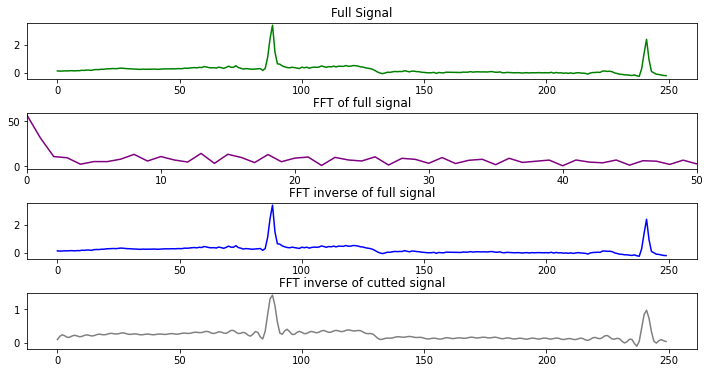

In [18]:
# Plot FFT of 1000 ms signal

data = arr_class_1[0]
signal_length = len(data)

full_signal_fft_values = np.abs(fft(data))
x_values_fft = range(0, len(data), 1)

fig = plt.figure(figsize=(12, 6))
grid = plt.GridSpec(4, 1,hspace=0.6)

full_signal = fig.add_subplot(grid[0, 0])
fft_comp = fig.add_subplot(grid[1, 0])
fft_comp_inverse = fig.add_subplot(grid[2, 0])
fft_comp_inverse_cutted = fig.add_subplot(grid[3, 0])

full_signal.plot(x_values_fft, list(data), color = 'green')
#full_signal.set_xlim(0, 250)
full_signal.set_title('Full Signal')
fft_comp.plot(x_values_fft, list(full_signal_fft_values), color = 'purple')
fft_comp.set_xlim(0, 50)
#fft_comp.set_ylim(0, 100)
fft_comp.set_title('FFT of full signal')
fft_comp_inverse.plot(x_values_fft, list(ifft(fft(data))), color = 'blue')
#fft_comp_inverse.set_xlim(0, 250)
#fft_comp_inverse.set_ylim(0, 100)
fft_comp_inverse.set_title('FFT inverse of full signal')
part_signal_inverse = np.concatenate((fft(data)[:20*signal_length//100],np.zeros([signal_length-(20*signal_length//100)])))
fft_comp_inverse_cutted.plot(x_values_fft, list(ifft(part_signal_inverse)), color = 'grey')
#fft_comp_inverse_cutted.set_xlim(0, 1000)
#fft_comp_inverse_cutted.set_ylim(0, 100)
fft_comp_inverse_cutted.set_title('FFT inverse of cutted signal')

### > FFT Class 3 signal

Text(0.5, 1.0, 'FFT inverse of cutted signal')

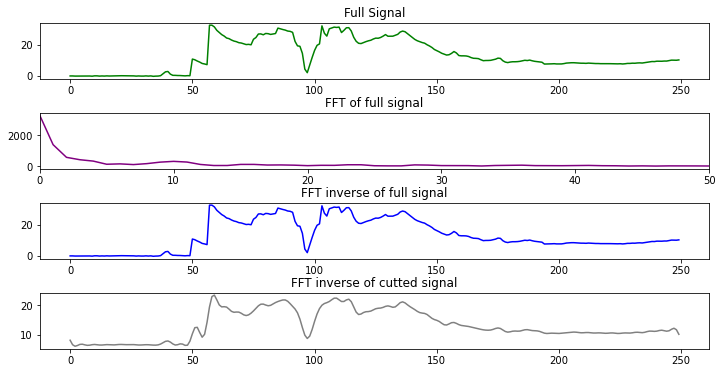

In [19]:
# Plot FFT of 1000 ms signal

data = arr_class_3[0]
signal_length = len(data)

full_signal_fft_values = np.abs(fft(data))
x_values_fft = range(0, len(data), 1)

fig = plt.figure(figsize=(12, 6))
grid = plt.GridSpec(4, 1,hspace=0.6)

full_signal = fig.add_subplot(grid[0, 0])
fft_comp = fig.add_subplot(grid[1, 0])
fft_comp_inverse = fig.add_subplot(grid[2, 0])
fft_comp_inverse_cutted = fig.add_subplot(grid[3, 0])

full_signal.plot(x_values_fft, list(data), color = 'green')
#full_signal.set_xlim(0, 250)
full_signal.set_title('Full Signal')
fft_comp.plot(x_values_fft, list(full_signal_fft_values), color = 'purple')
fft_comp.set_xlim(0, 50)
#fft_comp.set_ylim(0, 100)
fft_comp.set_title('FFT of full signal')
fft_comp_inverse.plot(x_values_fft, list(ifft(fft(data))), color = 'blue')
#fft_comp_inverse.set_xlim(0, 250)
#fft_comp_inverse.set_ylim(0, 100)
fft_comp_inverse.set_title('FFT inverse of full signal')
part_signal_inverse = np.concatenate((fft(data)[:20*signal_length//100],np.zeros([signal_length-(20*signal_length//100)])))
fft_comp_inverse_cutted.plot(x_values_fft, list(ifft(part_signal_inverse)), color = 'grey')
#fft_comp_inverse_cutted.set_xlim(0, 1000)
#fft_comp_inverse_cutted.set_ylim(0, 100)
fft_comp_inverse_cutted.set_title('FFT inverse of cutted signal')

## FFT plot with plotly [version 1]

In [20]:
# Test plotly
fig = px.line(y=[arr_class_1[0],arr_class_1[1]], color=px.Constant("Training loss"), title="Signal of class 1",labels=dict(x="Epochs number", y="Loss rate", color="Legend"))
fig.show()

In [21]:
# Plot FFT of 1000 ms signal

data = arr_class_1[0]
full_signal_fft_values = np.abs(fft(data))
x_values_fft = range(0, len(data), 1)

# Initialize figure with subplots
fig = make_subplots(rows=2, cols=1, subplot_titles=("Full ECG signal", "Fourier Transformation of ECG signal"))

# Add traces
fig.add_trace(go.Scatter(x=list(x_values_fft), y=list(data)),row=1, col=1)
fig.add_trace(go.Scatter(x=list(x_values_fft), y=list(full_signal_fft_values)), row=2, col=1)

# Update xaxis properties
fig.update_xaxes(title_text="Time (ms)", row=1, col=1)
fig.update_xaxes(title_text="Frequence (Hz)", range=[0, 120], row=2, col=1)

# Update yaxis properties
# fig.update_yaxes(title_text="Amplitude", row=1, col=1)
# fig.update_yaxes(title_text="Amplitude", row=2, col=1)

# Update title and height
fig.update_layout(showlegend=False) # , title_text="Fourier transformation", height=400, width=600

fig.show()

In [22]:
# Plot FFT of 1000 ms signal

data = arr_class_3[0]
full_signal_fft_values = np.abs(fft(data))
x_values_fft = range(0, len(data), 1)

# Initialize figure with subplots
fig = make_subplots(rows=2, cols=1, subplot_titles=("Full ECG signal", "Fourier Transformation of ECG signal"))

# Add traces
fig.add_trace(go.Scatter(x=list(x_values_fft), y=list(data)),row=1, col=1)
fig.add_trace(go.Scatter(x=list(x_values_fft), y=list(full_signal_fft_values)), row=2, col=1)

# Update xaxis properties
fig.update_xaxes(title_text="Time (ms)", row=1, col=1)
fig.update_xaxes(title_text="Frequence (Hz)", range=[0, 120], row=2, col=1)

# Update yaxis properties
# fig.update_yaxes(title_text="Amplitude", row=1, col=1)
# fig.update_yaxes(title_text="Amplitude", row=2, col=1)

# Update title and height
fig.update_layout(showlegend=False) # , title_text="Fourier transformation", height=400, width=600

fig.show()

# Wavelet Transformation

TypeError: alpha must be a float or None

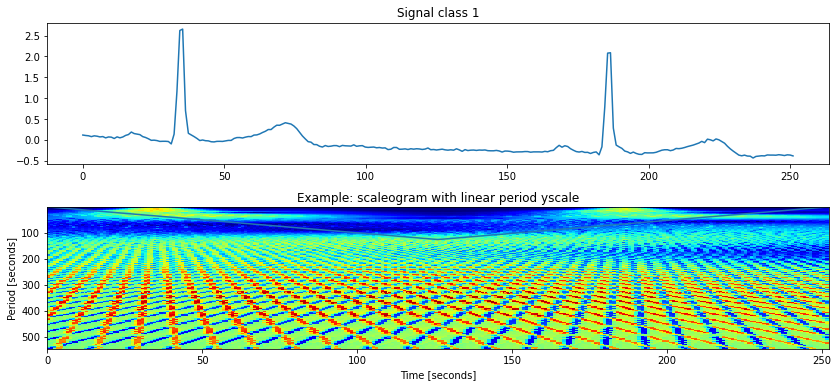

In [32]:
# Example of Wavelet transform for Synthetic data

data = (arr_class_1[2])
x_values_wvt = np.linspace(0, len(data)+1, N)
label = 1
N = len(data)
signal_length = len(data)

wavelet='cmor0.7-1.5'

signal_length = 1000
# range of scales to perform the transform
scales = scg.periods2scales( np.arange(1, signal_length+1) )

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 6))
fig.subplots_adjust(hspace=0.3)
ax1.plot(x_values_wvt, data); #ax1.set_xlim(0, 5)
ax1.set_title(f'Signal class {label}')
ax2 = scg.cws(x_values_wvt, data, scales=scales, wavelet=wavelet,
        ax=ax2, cmap="jet", cbar=None, ylabel="Period [seconds]", xlabel="Time [seconds]",
        title='Example: scaleogram with linear period yscale')

# Scaleogram

### Scaleogram Class 1

Default wavelet function used to compute the transform: morl ( Morlet wavelet )
Default wavelet function used to compute the transform: morl ( Morlet wavelet )
Default wavelet function used to compute the transform: morl ( Morlet wavelet )
Default wavelet function used to compute the transform: morl ( Morlet wavelet )
Default wavelet function used to compute the transform: morl ( Morlet wavelet )


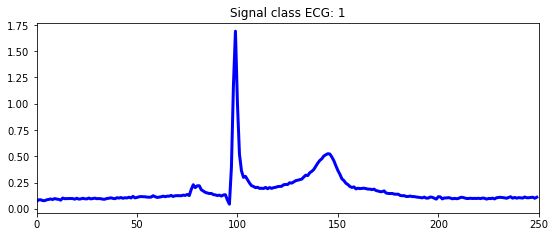

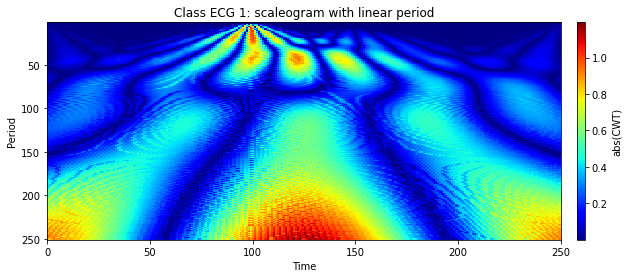

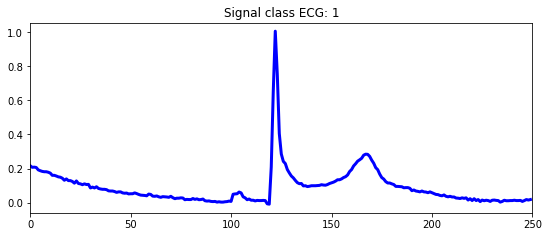

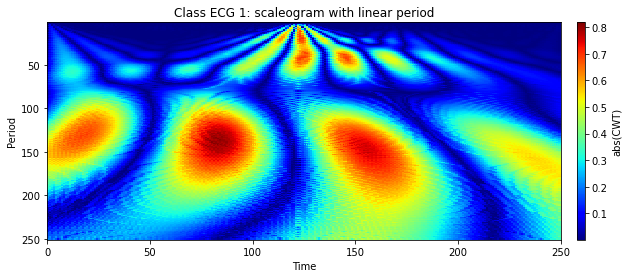

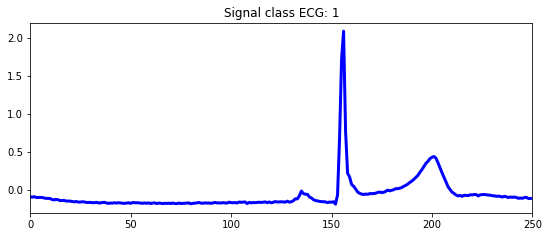

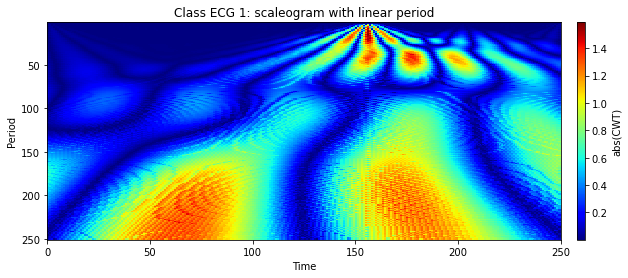

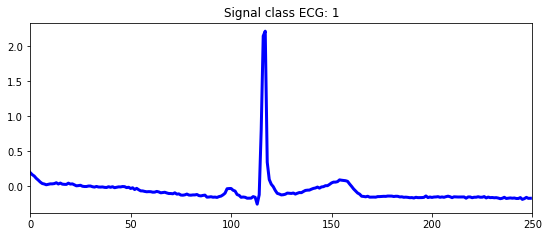

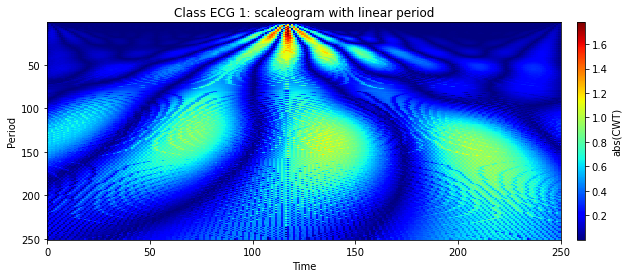

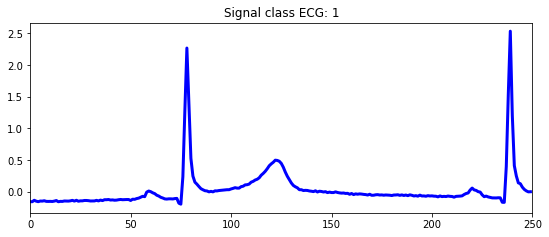

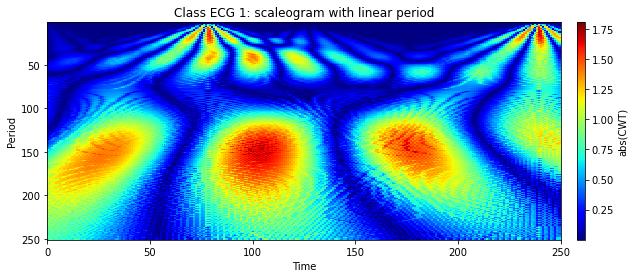

In [25]:
# choose default wavelet function 
scg.set_default_wavelet('morl')

data = arr_class_1

# Choice 5 random values in the array indice range
alist = np.random.choice(range(len(data)),5)

# Display signal & his scaleogram for each index
for i in alist:
    signal_length = 250
    # range of scales to perform the transform
    scales = scg.periods2scales( np.arange(1, signal_length+1) )
    x_values_wvt_arr = range(0,len(data[i]),1)

    # plot the signal 
    fig1, ax1 = plt.subplots(1, 1, figsize=(9, 3.5));  
    ax1.plot(x_values_wvt_arr, data[i], linewidth=3, color='blue')
    ax1.set_xlim(0, signal_length)
    ax1.set_title(f"Signal class ECG: 1")

    # the scaleogram
    scg.cws(data[i][:signal_length], scales=scales, figsize=(10, 4.0), coi = False, ylabel="Period", xlabel="Time",
            title=f"Class ECG 1: scaleogram with linear period"); 

    print("Default wavelet function used to compute the transform:", scg.get_default_wavelet(), "(",
          pywt.ContinuousWavelet(scg.get_default_wavelet()).family_name, ")")
    

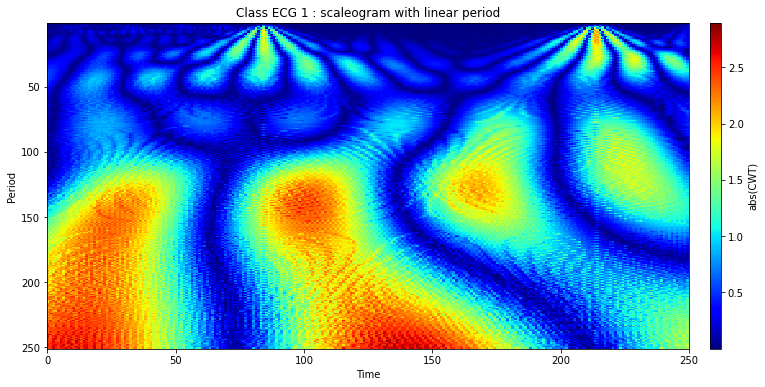

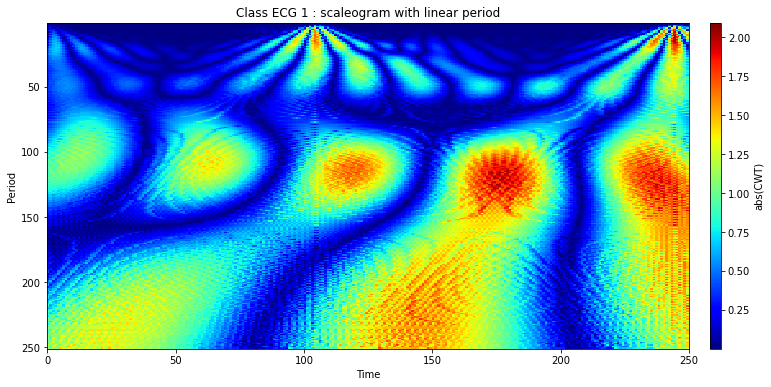

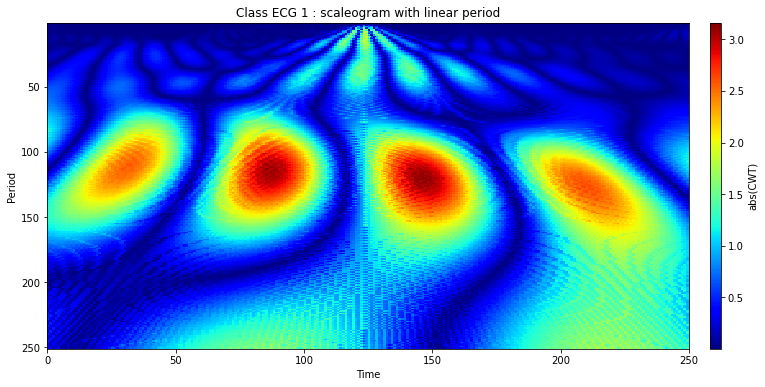

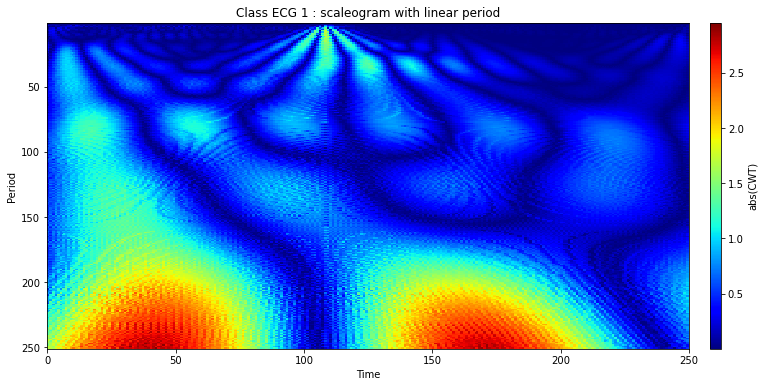

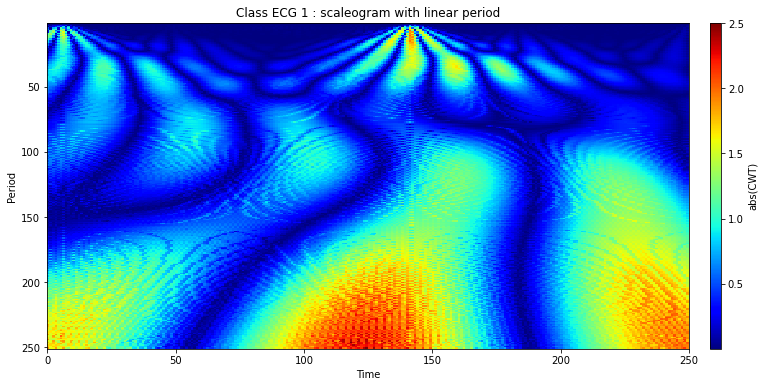

In [39]:
# choose default wavelet function 
scg.set_default_wavelet('morl')

#alist = np.random.choice(len(arr_class_1),15)
#alist = range(1,len(arr_class_2[:20]))
# nn = np.random.choice(len(arr_class_2))

for i in range(10,15):
    
    data = arr_class_1[i]
    x_values_wvt_arr = range(0,len(data),1)
    # Display signal & his scaleogram for each index
    signal_length = len(data)
    label = 1

    # range of scales to perform the transform
    scales = scg.periods2scales( np.arange(1, signal_length+1) )

    # plot the signal 
    # fig1, ax1 = plt.subplots(1, 1, figsize=(9, 3.5));  
    # ax1.plot(x_values_wvt_arr, data, linewidth=3, color='blue')
    # ax1.set_xlim(0, signal_length)
    # ax1.set_title(f"Signal class ECG: 1")
    fig = px.line(list(data), title=f"Full ECG signal - class {label}",width=800, height=400)

    # the scaleogram
    scg.cws(data, scales=scales, figsize=(12.5, 6), coi = False, ylabel="Period", xlabel="Time", title=f"Class ECG {label} : scaleogram with linear period"); 
    #ax.set_xticks([])
    #ax.set_yticks([])
    
    fig.update_layout(showlegend=False)
    fig.show()

#print("Default wavelet function used to compute the transform:", scg.get_default_wavelet(), "(", pywt.ContinuousWavelet(scg.get_default_wavelet()).family_name, ")")

    

About scaleogram for signals from class 1, we can notice : there is more concentration at the top of the image and less at the bottom. Also, the signal is not perfect so we can see some concentrations at the bottom of image

### Scaleogram Class 2 & 3

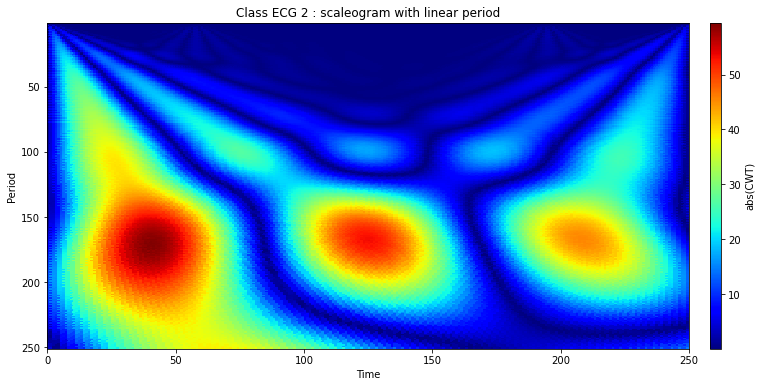

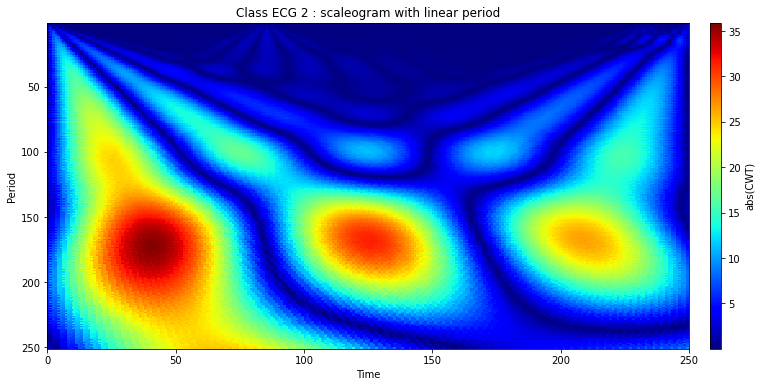

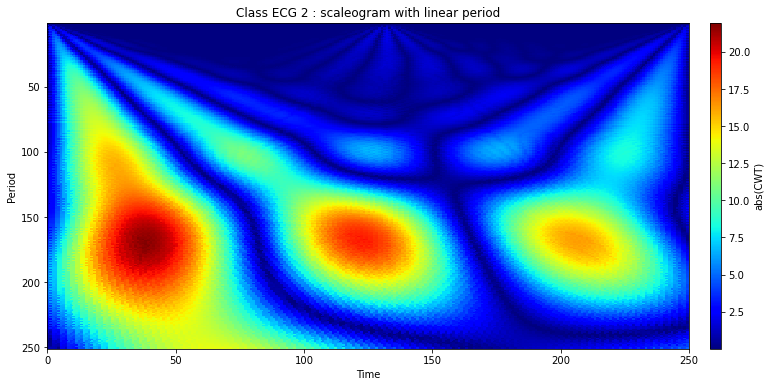

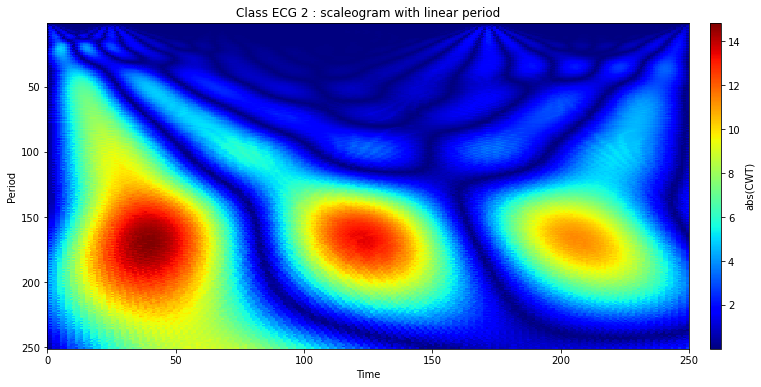

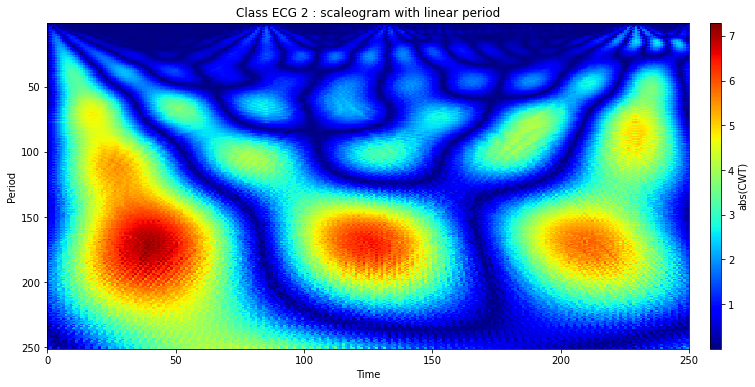

In [35]:
# choose default wavelet function 
scg.set_default_wavelet('morl')

#alist = np.random.choice(len(arr_class_1),15)
#alist = range(1,len(arr_class_2[:20]))
# nn = np.random.choice(len(arr_class_2))

for i in range(0,5):
    
    data = arr_class_2[i]
    x_values_wvt_arr = range(0,len(data),1)
    # Display signal & his scaleogram for each index
    signal_length = len(arr_class_2[i])

    # range of scales to perform the transform
    scales = scg.periods2scales( np.arange(1, signal_length+1) )

    # plot the signal 
    # fig1, ax1 = plt.subplots(1, 1, figsize=(9, 3.5));  
    # ax1.plot(x_values_wvt_arr, data, linewidth=3, color='blue')
    # ax1.set_xlim(0, signal_length)
    # ax1.set_title(f"Signal class ECG: 1")
    fig = px.line(list(data), title="Full ECG signal - class 2",width=800, height=400)
    fig.update_layout(showlegend=False)
    fig.show()

    # the scaleogram
    scg.cws(data, scales=scales, figsize=(12.5, 6), coi = False, ylabel="Period", xlabel="Time", title=f"Class ECG 2 : scaleogram with linear period"); 
    #ax.set_xticks([])
    #ax.set_yticks([])

#print("Default wavelet function used to compute the transform:", scg.get_default_wavelet(), "(", pywt.ContinuousWavelet(scg.get_default_wavelet()).family_name, ")")


About scaleogram for signals from class 2, we can notice : there is more concentration at the bottom and middle of the image. 


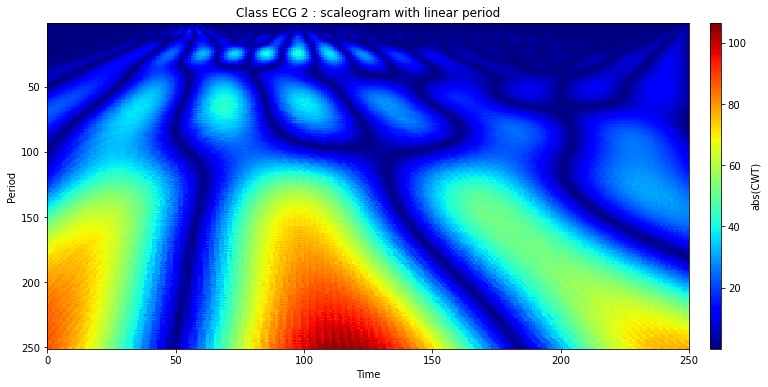

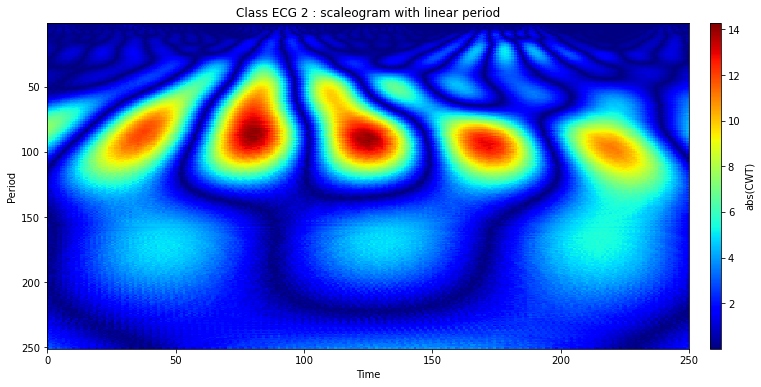

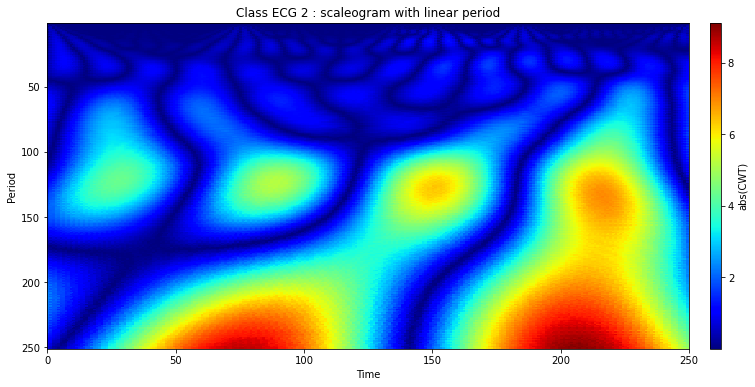

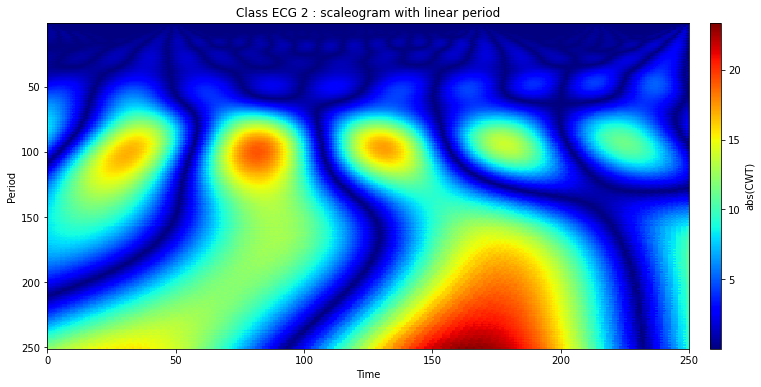

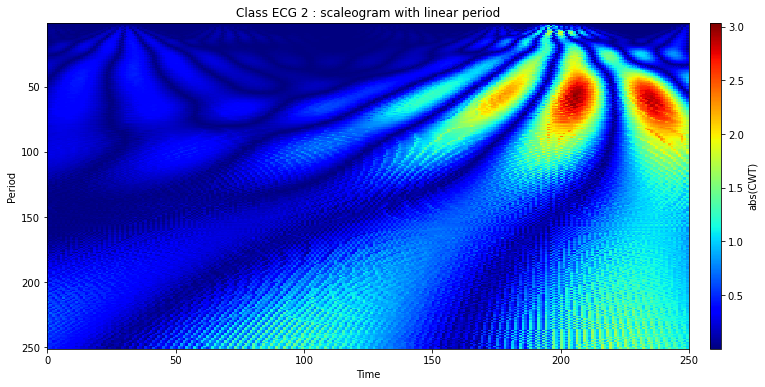

In [40]:
# choose default wavelet function 
scg.set_default_wavelet('morl')

#alist = np.random.choice(len(arr_class_1),15)
#alist = range(1,len(arr_class_2[:20]))
# nn = np.random.choice(len(arr_class_2))

for i in range(0,5):
    
    data = arr_class_3[i]
    x_values_wvt_arr = range(0,len(data),1)
    # Display signal & his scaleogram for each index
    signal_length = len(arr_class_3[i])

    # range of scales to perform the transform
    scales = scg.periods2scales( np.arange(1, signal_length+1) )

    # plot the signal 
    # fig1, ax1 = plt.subplots(1, 1, figsize=(9, 3.5));  
    # ax1.plot(x_values_wvt_arr, data, linewidth=3, color='blue')
    # ax1.set_xlim(0, signal_length)
    # ax1.set_title(f"Signal class ECG: 1")
    fig = px.line(list(data), title="Full ECG signal - class 2",width=800, height=400)
    fig.update_layout(showlegend=False)
    fig.show()

    # the scaleogram
    scg.cws(data, scales=scales, figsize=(12.5, 6), coi = False, ylabel="Period", xlabel="Time", title=f"Class ECG 2 : scaleogram with linear period"); 
    #ax.set_xticks([])
    #ax.set_yticks([])

#print("Default wavelet function used to compute the transform:", scg.get_default_wavelet(), "(", pywt.ContinuousWavelet(scg.get_default_wavelet()).family_name, ")")


About scaleogram for signals from class 3, we can notice : there is more concentration at the bottom of the image in general. 


Default wavelet function used to compute the transform: morl ( Morlet wavelet )


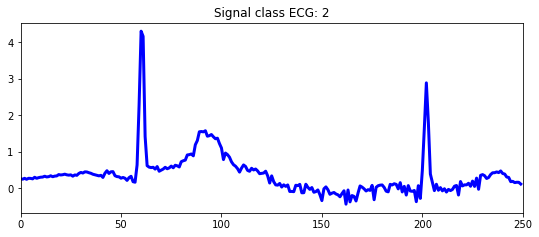

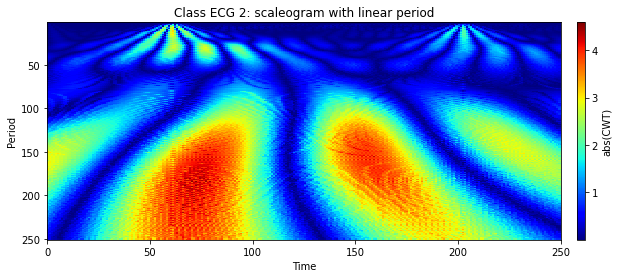

In [30]:
# Display Scaleogram of signal labelled in class 2
# choose default wavelet function 
scg.set_default_wavelet('morl')

# Choice 5 random values in the array indice range
# alist = np.random.choice(range(len(ecg_data_111001)),5)
nn = 9
data = arr_class_2[nn]
label = 2

# Display signal & his scaleogram for each index
signal_length = 250
# range of scales to perform the transform
scales = scg.periods2scales( np.arange(1, signal_length+1) )
x_values_wvt_arr = range(0,len(data),1)

# plot the signal 
fig1, ax1 = plt.subplots(1, 1, figsize=(9, 3.5));  
ax1.plot(x_values_wvt_arr, data, linewidth=3, color='blue')
ax1.set_xlim(0, signal_length)
ax1.set_title(f"Signal class ECG: 2")

# the scaleogram
scg.cws(data[:signal_length], scales=scales, figsize=(10, 4.0), coi = False, ylabel="Period", xlabel="Time",
        title=f"Class ECG 2: scaleogram with linear period"); 

print("Default wavelet function used to compute the transform:", scg.get_default_wavelet(), "(",
      pywt.ContinuousWavelet(scg.get_default_wavelet()).family_name, ")")

Default wavelet function used to compute the transform: morl ( Morlet wavelet )


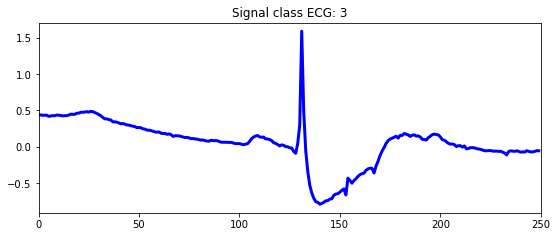

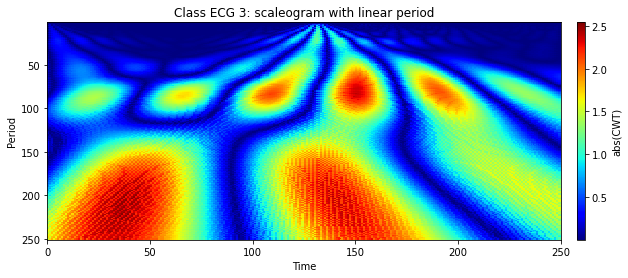

In [31]:
# Display Scaleogram of signal labelled in class 3
# choose default wavelet function 
scg.set_default_wavelet('morl')

# Choice 5 random values in the array indice range
# alist = np.random.choice(range(len(ecg_data_111001)),5)
nn = 9
data = arr_class_3[nn]
label = 3

# Display signal & his scaleogram for each index
signal_length = 250
# range of scales to perform the transform
scales = scg.periods2scales( np.arange(1, signal_length+1) )
x_values_wvt_arr = range(0,len(data),1)

# plot the signal 
fig1, ax1 = plt.subplots(1, 1, figsize=(9, 3.5));  
ax1.plot(x_values_wvt_arr, data, linewidth=3, color='blue')
ax1.set_xlim(0, signal_length)
ax1.set_title(f"Signal class ECG: {label}")

# the scaleogram
scg.cws(data[:signal_length], scales=scales, figsize=(10, 4.0), coi = False, ylabel="Period", xlabel="Time",
        title=f"Class ECG {label}: scaleogram with linear period"); 

print("Default wavelet function used to compute the transform:", scg.get_default_wavelet(), "(",
      pywt.ContinuousWavelet(scg.get_default_wavelet()).family_name, ")")

# Classification

## Test NN with 1000 values signal

In [166]:
# Convert array into list to train our model
arr_class_1_flatten = list(arr_2_250_class_1)
arr_class_2_flatten = list(arr_2_250_class_2)
arr_class_3_flatten = list(arr_2_250_class_3)

In [169]:
# Reduce samples data for each class to reduce_size
reduce_size = 1000
full_1500 = (arr_class_1_flatten[0:reduce_size] + arr_class_2_flatten[0:reduce_size] + arr_class_3_flatten[0:reduce_size])


In [171]:
# create the data set with scaleogramme image for each signal data
# We create a X_full 
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

start_time = time.time()

fs = len(full_1500[0])
# sgn_length = 1000   #65536   Pay atention with ram memory! 
size_dataset = len(full_1500)
scales = range(1, fs)
waveletname = 'morl'
 
X_full = np.ndarray(shape=(size_dataset, fs-1, fs-1, 3))
                 
for i in tqdm(range(0, size_dataset)):
    if i % 500 == 0:
        print (i, 'done!')
    for j in range(0, 3):
        signal = full_1500[i]
        coeff, freq = pywt.cwt(signal, scales, waveletname, 1)
        X_full[i, :, :, j] = coeff[:,:fs-1]

end_time = time.time()

print(f"Time spent : {end_time - start_time} seconds")

0 done!
500 done!
1000 done!
1500 done!
2000 done!
2500 done!

Time spent : 542.4796450138092 seconds


In [172]:
X_full.shape

(3000, 249, 249, 3)

In [173]:
list_labels_class_1 = ['1']*reduce_size 
list_labels_class_2 = ['2']*reduce_size 
list_labels_class_3 = ['3']*reduce_size 
list_labels = (list_labels_class_1 + list_labels_class_2 + list_labels_class_3)

le = preprocessing.LabelEncoder()
list_labels_encoded = le.fit_transform(list_labels)
X_train, X_test, y_train, y_test = train_test_split(X_full, list_labels_encoded, test_size=0.25, random_state=42)


In [174]:
X_train.shape

(2250, 249, 249, 3)

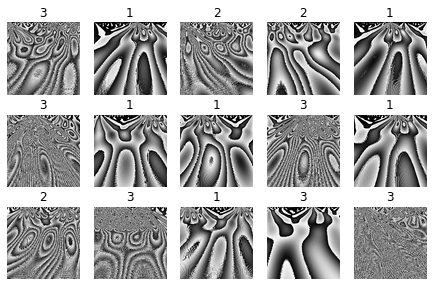

In [175]:
#Inspecting DATA that we will give as input for the model
n_rows = 3
n_cols = 5
class_names = ['1', '2', '3']
plt.figure(figsize=(n_cols*1.5, n_rows * 1.6))
for row in range(n_rows):
    for col in range(n_cols):
        index = n_cols * row + col
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow((X_train[index]*255).astype(np.uint8), cmap="binary", interpolation="spline36")
        plt.axis('off')
        plt.title(class_names[y_train[index]])
plt.show()

In [185]:
# Defining basic NN
num_filter, num_classes = 3, 3
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[fs-1, fs-1, num_filter]),
    keras.layers.Dense(1028, activation="relu"),
    #keras.layers.Dense(600, activation="relu"),
    keras.layers.Dense(512, activation="relu"), 
    keras.layers.Dense(300, activation="relu"),                 
    keras.layers.Dense(100, activation="relu"),
    keras.layers.Dense(num_classes, activation="softmax")
])
model.compile(loss="sparse_categorical_crossentropy",
              optimizer="Adam", metrics=["accuracy"])

In [186]:
# Display model layers and neurones for each layer
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_3 (Flatten)          (None, 186003)            0         
_________________________________________________________________
dense_10 (Dense)             (None, 1028)              191212112 
_________________________________________________________________
dense_11 (Dense)             (None, 512)               526848    
_________________________________________________________________
dense_12 (Dense)             (None, 300)               153900    
_________________________________________________________________
dense_13 (Dense)             (None, 100)               30100     
_________________________________________________________________
dense_14 (Dense)             (None, 3)                 303       
Total params: 191,923,263
Trainable params: 191,923,263
Non-trainable params: 0
________________________________________

In [187]:
# Train the model with training and validation data
history = model.fit(X_train, y_train, epochs=20, validation_data=(X_test, y_test))


Epoch 1/20
71/71 [==============================] - 106s 1s/step - loss: 49.6538 - accuracy: 0.3818 - val_loss: 27.0720 - val_accuracy: 0.3867
Epoch 2/20
71/71 [==============================] - 115s 2s/step - loss: 13.6470 - accuracy: 0.4120 - val_loss: 10.4790 - val_accuracy: 0.3840
Epoch 3/20
71/71 [==============================] - 76s 1s/step - loss: 4.3475 - accuracy: 0.4631 - val_loss: 3.6085 - val_accuracy: 0.5360
Epoch 4/20
71/71 [==============================] - 71s 1s/step - loss: 2.2572 - accuracy: 0.5333 - val_loss: 2.0048 - val_accuracy: 0.5453
Epoch 5/20
71/71 [==============================] - 75s 1s/step - loss: 4.0122 - accuracy: 0.4618 - val_loss: 4.1824 - val_accuracy: 0.4280
Epoch 6/20
71/71 [==============================] - 79s 1s/step - loss: 2.6200 - accuracy: 0.4898 - val_loss: 2.1415 - val_accuracy: 0.4960
Epoch 7/20
71/71 [==============================] - 97s 1s/step - loss: 1.8997 - accuracy: 0.5022 - val_loss: 1.3844 - val_accuracy: 0.5680
Epoch 8/20
71/

In [188]:
model.evaluate(X_test, y_test)

24/24 [==============================] - 5s 197ms/step - loss: 0.9772 - accuracy: 0.6773


[0.977192223072052, 0.6773333549499512]

In [180]:
def plot_learning_curves(history):
    pd.DataFrame(history.history).plot(figsize=(8, 5))
    plt.grid(True)
    plt.gca().set_ylim(0, 1)
    plt.xlabel('epochs', size = 16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.savefig('Figure_epochs.png')   
    plt.close()

In [181]:
plot_learning_curves(history)

In [182]:
prediction = model.predict(X_test)
pred_classes = prediction.argmax(axis=1)

In [183]:
# Confusion Matrix With Scikit
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, pred_classes)
cm_norm =  cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

In [183]:
# Ploting Confusion Matrix

df_cm = pd.DataFrame(cm_norm, ['1', '2', '3'], ['1', '2', '3'])
plt.figure(figsize = (10,6))
conf = sns.heatmap(df_cm, annot=True, square=True, annot_kws={"size": 12})
conf.set_xlabel('Prediction')
conf.set_ylabel('True')# Ploting Confusion Matrix